

#### **Projeto de Data Science**
*by [Artur Freitas](https://www.linkedin.com/in/artur-sn-freitas/)*

---

# Análise dos dados de um ecommerce do tipo clube de assinatura

Analisaremos os dados de um ecommerce do tipo assinatura com o objetivo de entender o comportamento dos usuários afim de predizer vendas e cancelamentos. Temos as bases disponíveis do próprio ecommerce e do google analytics.

Um clube de assinatura é uma empresa que entrega produtos periodicamente (ou quinzena, mensal, etc.) para seus associados mediante um pagamento recorrente.

Esse tipo de negócio está em alta na economia da recorrência graças à comodidade e experiência de compra diferenciada. O modelo comercial mais comum é o envio de kits e boxes de produtos selecionados para a casa dos clientes, conforme o plano assinado.

É importante fazermos algumas nomenclaturas clássicas para as áreas de marketing e vendas:

- Um lead é um usuário que tem algum tipo de interesse nos serviços ou produtos de um negócio. Ou seja, nada mais é do que um consumidor em potencial que é identificado por uma empresa e precisa finalizar a jornada de compra até que a conversão aconteça. 
- Um assinante é um lead que realizou a compra da sua assinatura.

- LTV: liftime value, é quanto o assinante gasta durante seu período de assinatura.

- Churn: cancelamento da assinatura ou taxa de cancelamento.

De posse dos dados de navegação e vendas, faremos: 

> Etapa 1: Importar, tratar e analisar os dados (EDA).

> Etapa 2: Faremos uma classificação dos usuários referente a disposição para realizar a de compra utilizando da segmentação Kmeans

> Etapa 3: Vendas cruzadas para quem comprou: ao analisar as compras conjuntas anteriores, podemos identificar quais produtos podem ser oferecidos para determinadas compras.

> Etapa 4: Previsão do LTV e retenção: faremos uma segmenteção Kmeans, utilizando a técnica RFV adapatada para o modelo de assinatura e então faremos um modelo para a previsão da do valor da vida útil (LTV) e a quantidade de meses como assinante dos usuários.

> Etapa 5: Previsão de churn: desenvolveremos um modelo para prever a propensão ao cancelamento dos assinantes.

Dessa maneira, teremos um algoritmo que pode ser aplicado para novos leads e novos assinantes mensalmente a fim de buscar um aumento de vendas, de LTV e diminuição de churn.

# Etapa 1:  Importar, tratar e analisar os dados (EDA).

## Importando bibliotecas

In [1]:
# importando os pacotes necessarios para a análise
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, classification_report, r2_score, mean_squared_error
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from imblearn.under_sampling import RandomUnderSampler

## Importando e unindo bases do site próprio e do google analytics

In [2]:
user_id_1 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_1.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_id_2 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_2.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_comportamento_1 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_comportamento_1.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_comportamento_2 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_comportamento_2.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_pesquisas = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_comportamento_1.xlsx', 'rb'),
              sheet_name='Conjunto de dados2')

user_conversoes = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_conversoes.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_imetas = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_conversoes.xlsx', 'rb'),
              sheet_name='Conjunto de dados2')

user_ecommerce = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_ecommerce.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_checkouts = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_ecommerce.xlsx', 'rb'),
              sheet_name='Conjunto de dados2')

user_usuarios_1 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_usuarios_1.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_usuarios_2 = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_usuarios_2.xlsx', 'rb'),
              sheet_name='Conjunto de dados1')

user_pag_sessoes =pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\user_id_usuarios_1.xlsx', 'rb'),
              sheet_name='Conjunto de dados2')

usuarios = pd.read_csv(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\usuarios_site_tudo.csv', sep = ';')

pedidos = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\pedidos_site_tudo.xlsx', 'rb'))
pedidos_reco = pd.read_excel(open(r'C:\Users\arsnf\OneDrive\jupyter\portfolio\umma\Previsao_vendas\bases\mkt_umma\pedidos_site_tudo_recomenda.xlsx', 'rb'))
pedidos_reco = pedidos_reco[['user_id', 'id_pedido', 'Order Number', 'Order Status', 'Order Date',
       'Order Subtotal Amount', 'Order Shipping Amount',
       'Order Total Amount', 'Variation Id', 'SKU', 'Item Name', 'Quantity',
       'Item Cost', 'Coupon Code', 'Onde nos conheceu', 'Cidade', 'Estado',
       'CEP']]

C:\Users\arsnf\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
C:\Users\arsnf\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
C:\Users\arsnf\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
C:\Users\arsnf\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
C:\Users\arsnf\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains

In [3]:
user_id = pd.concat([user_id_1,user_id_2])
user_comportamento = pd.concat([user_comportamento_1,user_comportamento_2])
user_usuarios = pd.concat([user_usuarios_1,user_usuarios_2])
dados_analytics = user_id.merge(user_comportamento, how = 'left', on = 'user_id')
dados_analytics = dados_analytics.merge(user_usuarios, how = 'left', on = 'user_id')

usuarios.columns = ['user_id', 'Ur Form Id', 'Billing Ondenosconheceu',
       'User Pass', 'id_pedido','User Registered', 'Last Order Date', 'Last Order Total',
       'Orders Count', 'Orders Total', 'Billing City', 'Billing Postcode',
       'Billing State']

pedidos_usuarios = usuarios.merge(pedidos, how='left', on='id_pedido')
df= pedidos_usuarios.merge(dados_analytics, how='left', on='user_id')

#usuarios adm e xsottel
indices = [df[df['user_id'] == 1].index[0], df[df['user_id'] == 434].index[0], df[df['user_id'] == 3634].index[0]]
df.drop(indices, inplace = True)

df.head()

,user_id,Ur Form Id,Billing Ondenosconheceu,User Pass,id_pedido,User Registered,Last Order Date,Last Order Total,Orders Count,Orders Total,...,Entradas/Visualizações de página,Páginas / sessão,Número de sessões por usuário,Porcentagem de novas sessões,Saídas,Rejeições,Telas/sessão,Tempo médio na página,Visualizações de páginas únicas,Visualizações únicas de tela
0,287,NaN,NaN,NaN,1,08/03/2019 16:41,"2022-08-07, 09:42:20 AM",271.06,39,10222.34,...,0.157895,6.333333,1.5,0.333333,3.0,1.0,0.0,17.875000,12.0,0.0
1,242,NaN,NaN,NaN,2,18/02/2019 22:28,-,-,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,618,NaN,NaN,NaN,3,02/07/2019 18:02,"2022-08-02, 09:40:45 AM",195.9,38,6726.6,...,0.042553,23.500000,1.0,1.000000,2.0,0.0,0.0,38.288889,32.0,0.0
3,634,NaN,NaN,NaN,6,03/07/2019 17:12,-,-,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,693,NaN,NaN,NaN,9,18/07/2019 17:05,"2019-07-18, 02:05:26 PM",89.7,1,89.7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Exploração dos dados

Vamos explorar dados das bases obtidas. Com as informações de um clube de assinatura sobre a navegação no site e sobre a distribuição pelo Brasil. Estamos interessados nas variáveis que podem definir e classificar o comportamento dos leads a fim de classificá-los. Para isso analisaremos em relação uma variável indicativa se houve compra ou não. Também já excluiremos as colunas duplicadas nas bases e alteraremos os nomes das colunas.

In [4]:
df.drop(['Billing Ondenosconheceu', 'Billing City', 'Billing Postcode',
       'Billing State','Item Cost'], axis = 1, inplace = True)
df.columns = ['user_id', 'form_id', 'user_pass',
       'id_pedido', 'data_cadastro', 'data_ultimo_pedido', 'total_ultimo_pedido',
       'contagem_pedido', 'total_por_pedido', 'numero_pedido', 'status_pedido', 'data_pedido',
       'valor', 'valor_frete', 'valor_total',
       'variation_id', 'SKU', 'item', 'quantidade','cupom', 
       'onde_conheceu', 'cidade', 'estado', 'CEP',
       'metodo_envio', 'sessoes', 'duracao_media_sessao',
       'taxa_rejeicao', 'check_outs',
       'visualizacoes_produto','produtos_no_carrinho', 'receita', 'transações',
       'pesquisas_organicas', 'comb_dimensoes_exclusivas',
       'entradas', 'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
       'sessoes_por_usuario', 'taxa_novas_sessoes',
       'saidas', 'rejeicoes', 'telas_por_sessao', 'tempo_medio_pagina',
       'visualizacoes_paginas_unicas', 'visualizacoes_telas_unicas']

Vamos criar a variável alvo comprou, indicando se houve uma compra ou não de assinatura

In [5]:
df['comprou'] = np.where(df['valor_total'].isna(), 0, 1)
df['total_por_pedido'] = np.where(df['total_por_pedido'] == '-', 0, df['total_por_pedido'])
df['total_por_pedido'] = df['total_por_pedido'].astype(float)
df.head()

,user_id,form_id,user_pass,id_pedido,data_cadastro,data_ultimo_pedido,total_ultimo_pedido,contagem_pedido,total_por_pedido,numero_pedido,...,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,telas_por_sessao,tempo_medio_pagina,visualizacoes_paginas_unicas,visualizacoes_telas_unicas,comprou
0,287,NaN,NaN,1,08/03/2019 16:41,"2022-08-07, 09:42:20 AM",271.06,39,10222.34,8956.0,...,6.333333,1.5,0.333333,3.0,1.0,0.0,17.875000,12.0,0.0,1
1,242,NaN,NaN,2,18/02/2019 22:28,-,-,-,0.00,9300.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,618,NaN,NaN,3,02/07/2019 18:02,"2022-08-02, 09:40:45 AM",195.9,38,6726.60,9947.0,...,23.500000,1.0,1.000000,2.0,0.0,0.0,38.288889,32.0,0.0,1
3,634,NaN,NaN,6,03/07/2019 17:12,-,-,-,0.00,10089.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,693,NaN,NaN,9,18/07/2019 17:05,"2019-07-18, 02:05:26 PM",89.7,1,89.70,11123.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [6]:
df.shape

(9380, 47)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9380 entries, 0 to 9382
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   user_id                        9380 non-null   int64         
 1   form_id                        4373 non-null   float64       
 2   user_pass                      0 non-null      float64       
 3   id_pedido                      9380 non-null   int64         
 4   data_cadastro                  9380 non-null   object        
 5   data_ultimo_pedido             9380 non-null   object        
 6   total_ultimo_pedido            9380 non-null   object        
 7   contagem_pedido                9380 non-null   object        
 8   total_por_pedido               9380 non-null   float64       
 9   numero_pedido                  1673 non-null   float64       
 10  status_pedido                  1673 non-null   object        
 11  data_pedido      

#### Temos de corrigir algumas variáveis:

    - As datas estão como string
    - Temos variáveis com dados faltantes
    - Temos de observar valores fora da realidade
    - Temos de observar outliers

### Vamos analisar as variáveis da base

 - Atributos **categóricos**.

In [8]:
df.select_dtypes('object').describe().transpose()

,count,unique,top,freq
data_cadastro,9380,8475,11/11/2021 16:41,22
data_ultimo_pedido,9380,1095,-,8252
total_ultimo_pedido,9380,761,-,8252
contagem_pedido,9380,33,-,8252
status_pedido,1673,3,Concluído,1404
SKU,1368,184,1 / 200 / 100 / c / 0,234
item,1673,23,ASSINATURA MENSAL,604
cupom,505,86,saka,73
onde_conheceu,1059,27,Macário,245
cidade,1672,595,São Paulo,304


 - Atributos **numéricos**.

In [9]:
df.drop(['user_id', 'form_id', 'id_pedido', 'variation_id', 
         'user_pass', 'numero_pedido'], axis=1).select_dtypes('number').describe().transpose()

,count,mean,std,min,25%,50%,75%,max
total_por_pedido,9380.0,86.735281,422.218900,0.000000,0.000000,0.000000,0.000000,10222.34
valor,1673.0,133.706426,60.581825,19.900000,101.900000,128.900000,147.900000,825.80
valor_frete,1673.0,23.855541,9.157490,0.000000,18.690000,21.360000,27.000000,152.80
valor_total,1673.0,155.359492,62.401939,0.000000,122.410000,148.470000,172.530000,866.70
quantidade,1673.0,1.022714,0.188066,1.000000,1.000000,1.000000,1.000000,4.00
sessoes,5353.0,4.266579,9.792509,1.000000,1.000000,1.000000,3.000000,118.00
duracao_media_sessao,5353.0,347.935903,408.431531,0.000000,97.222222,216.333333,427.000000,4866.00
taxa_rejeicao,5353.0,0.138946,0.232001,0.000000,0.000000,0.000000,0.266667,1.00
check_outs,5353.0,1.222118,3.267785,0.000000,0.000000,0.000000,1.000000,77.00
visualizacoes_produto,5353.0,2.135812,4.828065,0.000000,0.000000,1.000000,2.000000,99.00


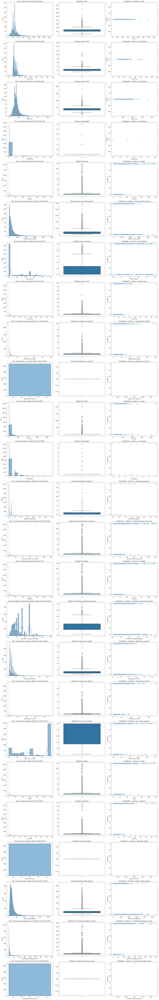

In [10]:
def numerico_plot(df, target='comprou'):   
    cols = 3
    num_cols = df.select_dtypes(include='number').iloc[:, 1:-1].columns
    rows = len(num_cols)

    figure, axs = plt.subplots(rows,cols,figsize = (20,rows*5))

    for i, col in enumerate(num_cols):
        sns.histplot(df[col], fill = True, kde= True, ax=axs[i,0])
        sns.boxplot(df[col], ax=axs[i,1])
        sns.scatterplot(x=df[col], y=df[target], ax=axs[i,2])
        axs[i,0].set_title(f"Dist. of {col}; Skew:{round(df[col].skew(),2)}; Null:{round(100*(df[col].isnull().sum()/len(df)),2)}%")
        axs[i,1].set_title(f"Boxplot of {col}")
        axs[i,2].set_title(f"Scatterplot : {target} v. {col}")
    plt.tight_layout()
    plt.show()
    
numerico_plot(df.drop(['user_id', 'form_id', 'id_pedido', 'variation_id', 
         'user_pass', 'numero_pedido'], axis=1))

#### Apontamentos iniciais:

Podemos ver dados faltantes nos categóricos e temos outliers. Possivelmente temos valores irreais para os valores e dados de comportamento dentro do site, como duração média de sessão de 700 minutos. Devemos analisar mais a fundo para entender esses números. Para isso, filtraremos para algumas variáveis sem valores ou que não agregam e também as correlações

#### Correlação das variáveis

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\569308666.py:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  'tempo_medio_pagina','visualizacoes_paginas_unicas', 'comprou']].corr()


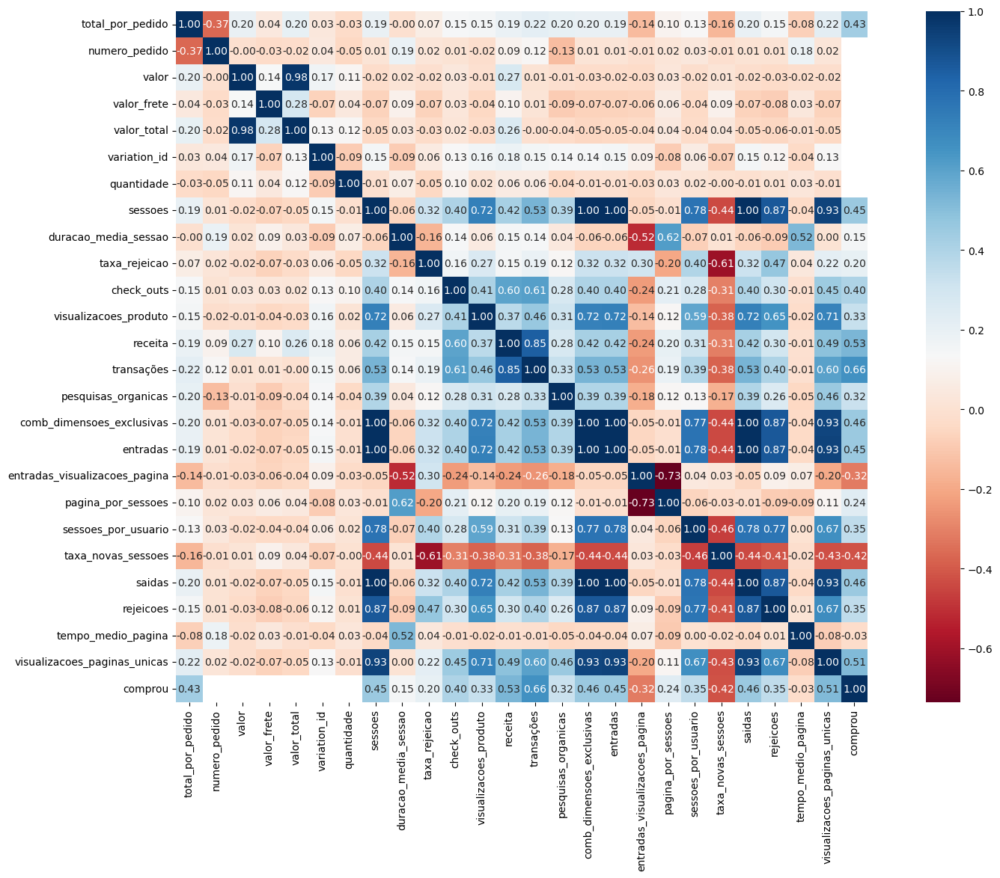

In [11]:
plt.subplots(figsize=(20, 12))
corr = df[[ 'total_ultimo_pedido', 'contagem_pedido',
       'total_por_pedido', 'numero_pedido', 'status_pedido', 
       'valor', 'valor_frete', 'valor_total', 'variation_id', 'item',
       'quantidade', 'sessoes', 'duracao_media_sessao', 'taxa_rejeicao',
       'check_outs', 'visualizacoes_produto', 
       'receita', 'transações', 'pesquisas_organicas',
       'comb_dimensoes_exclusivas', 'entradas',
       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
       'sessoes_por_usuario', 'taxa_novas_sessoes', 'saidas', 'rejeicoes',
       'tempo_medio_pagina','visualizacoes_paginas_unicas', 'comprou']].corr()
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot = True);

Algumas das variáveis tem correlação alta entre si, possivelmente podem ter referências semelhantes e podemos eliminá-las, como ['user_id', 'valor_total', 'quantidade', 'comb_dimensoes_exclusivas', 'rejeicoes', 'visualizacoes_produto', 'visualizacoes_paginas_unicas', 'saidas', 'sessoes_por_usuario', 'entradas'] 


## Aprofundando nas variáveis categóricas

In [12]:
def analise(df, var, sort = 'valor', agg = 'valor'):
    df_analise1 = df[['valor', 'valor_frete', 'valor_total', 
                      'item','quantidade', 'cupom', 'onde_conheceu', 'cidade', 'estado',
                       'sessoes', 'duracao_media_sessao', 'taxa_rejeicao',
                       'check_outs', 'visualizacoes_produto','pesquisas_organicas',
                       'comb_dimensoes_exclusivas', 'entradas',
                       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
                       'sessoes_por_usuario', 'taxa_novas_sessoes', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
                       'visualizacoes_paginas_unicas']].groupby(var).sum().sort_values(sort, ascending  = False)
    
    df_analise2 = df[df[var].isin(df_analise1.index[:7])][[var, 'sessoes', 'duracao_media_sessao', 'taxa_rejeicao',
                       'check_outs', 'visualizacoes_produto','pesquisas_organicas',
                       'comb_dimensoes_exclusivas', 'entradas',
                       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
                       'sessoes_por_usuario', 'taxa_novas_sessoes', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
                       'visualizacoes_paginas_unicas']].groupby(var).mean()

    fig, ax = plt.subplots(figsize=(10, 8))

    # add the plot
    sns.barplot(data = df, x = var, y = agg)
    plt.title(var + " x " + agg, weight="bold", c="red", fontsize=15)
    plt.xlabel("",weight="bold",c="k")
    plt.xticks(rotation=0, weight="bold")
    plt.ylabel("Valor",weight= "bold",c="k")
    plt.yticks(weight="bold")

    # add the annotation
    ax.bar_label(ax.containers[-1], fmt='\n%.2f', label_type='center')
    plt.xticks(rotation = 90)
    return df_analise1, df_analise2

### - Variável: onde_conheceu

Essa variável indica onde o lead teve o primeiro contato com a empresa

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\132397960.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'visualizacoes_paginas_unicas']].groupby(var).sum().sort_values(sort, ascending  = False)


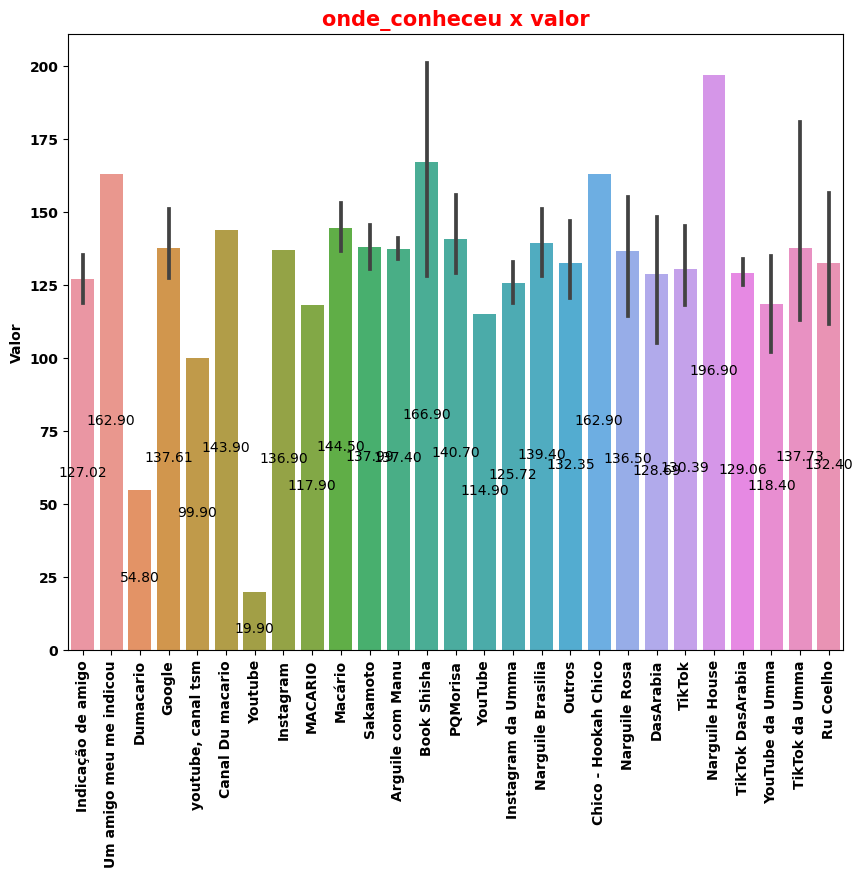

In [13]:
df_onde_conheceu_group, df_onde_conheceu_comp = analise(df, 'onde_conheceu')

In [14]:
df_onde_conheceu_group.head(10)

,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
onde_conheceu,,,,,,,,,,,,,,,,,,,,
Macário,35402.1,5809.40,40263.91,247.0,3763.0,102971.887275,60.205433,1005.0,1563.0,256.0,3784.0,3763.0,48.875742,1470.115448,1801.721426,72.851404,3774.0,1228.0,22912.494829,11874.0
Sakamoto,25252.3,4187.91,28847.08,185.0,3099.0,76498.871402,49.059909,791.0,1453.0,217.0,3132.0,3099.0,35.991574,1099.621027,1252.414286,52.975767,3102.0,1185.0,15622.432892,9148.0
Google,23117.9,4041.30,26731.82,177.0,1919.0,84328.681716,36.435413,729.0,731.0,149.0,1944.0,1919.0,29.935061,1099.986395,1006.700794,61.052765,1921.0,631.0,15143.078773,6293.0
TikTok DasArabia,15615.7,3094.15,18682.87,122.0,959.0,70745.413323,19.361037,241.0,299.0,56.0,977.0,959.0,20.285909,906.139378,487.685714,56.773425,959.0,274.0,12759.790467,3485.0
Instagram da Umma,13075.0,2580.17,15372.91,108.0,1167.0,50302.814046,22.910745,340.0,447.0,65.0,1178.0,1166.0,19.322012,656.214137,555.289683,34.376407,1167.0,344.0,9443.684998,4161.0
Indicação de amigo,8510.2,1484.50,9943.86,67.0,730.0,36110.572910,14.039024,302.0,317.0,58.0,734.0,730.0,12.497859,403.659985,370.225397,18.461646,733.0,194.0,6928.692890,2521.0
TikTok,7171.4,1334.53,8015.66,56.0,540.0,29459.340561,13.102750,271.0,260.0,42.0,542.0,540.0,9.576966,412.258056,251.800000,25.564227,540.0,193.0,4850.479220,1755.0
PQMorisa,4221.0,696.23,4693.29,30.0,357.0,12606.651553,6.721024,109.0,98.0,29.0,357.0,357.0,5.441481,197.170496,136.158333,8.497226,357.0,115.0,2315.804813,1154.0
TikTok da Umma,2479.1,498.37,2977.47,18.0,213.0,8105.886797,2.250624,18.0,32.0,10.0,244.0,213.0,3.250619,111.480023,101.500000,8.209702,213.0,61.0,1761.207856,571.0


In [15]:
df_onde_conheceu_comp.head(10)

,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
onde_conheceu,,,,,,,,,,,,,,,,
Google,11.845679,520.547418,0.224910,4.500000,4.512346,0.919753,12.000000,11.845679,0.184784,6.790039,6.214202,0.376869,11.858025,3.895062,93.475795,38.845679
Indicação de amigo,11.587302,573.183697,0.222842,4.793651,5.031746,0.920635,11.650794,11.587302,0.198379,6.407301,5.876594,0.293042,11.634921,3.079365,109.979252,40.015873
Instagram da Umma,11.787879,508.109233,0.231422,3.434343,4.515152,0.656566,11.898990,11.777778,0.195172,6.628426,5.608987,0.347236,11.787879,3.474747,95.390758,42.030303
Macário,15.810924,432.654989,0.252964,4.222689,6.567227,1.075630,15.899160,15.810924,0.205360,6.176956,7.570258,0.306098,15.857143,5.159664,96.270987,49.890756
Sakamoto,17.607955,434.652678,0.278749,4.494318,8.255682,1.232955,17.795455,17.607955,0.204498,6.247847,7.115990,0.300999,17.625000,6.732955,88.763823,51.977273
TikTok,10.188679,555.836614,0.247222,5.113208,4.905660,0.792453,10.226415,10.188679,0.180697,7.778454,4.750943,0.482344,10.188679,3.641509,91.518476,33.113208
TikTok DasArabia,8.127119,599.537401,0.164077,2.042373,2.533898,0.474576,8.279661,8.127119,0.171914,7.679147,4.132930,0.481131,8.127119,2.322034,108.133818,29.533898


As indicações de onde nos conheceram mais usadas são os influenciadores Macario, Sakamoto e dasrabias. Também temos somos encontrados pelo google searc, instagram próprio e indicação de assinantes. Temos também as médias das métricas de comportamento de quem nos deu as indicações, usaremos para definir o perfil comportamental

### - Variável: item

Essa variável indica o nome do item comprado ou incluido na assinatura como item extra

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\132397960.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'visualizacoes_paginas_unicas']].groupby(var).sum().sort_values(sort, ascending  = False)


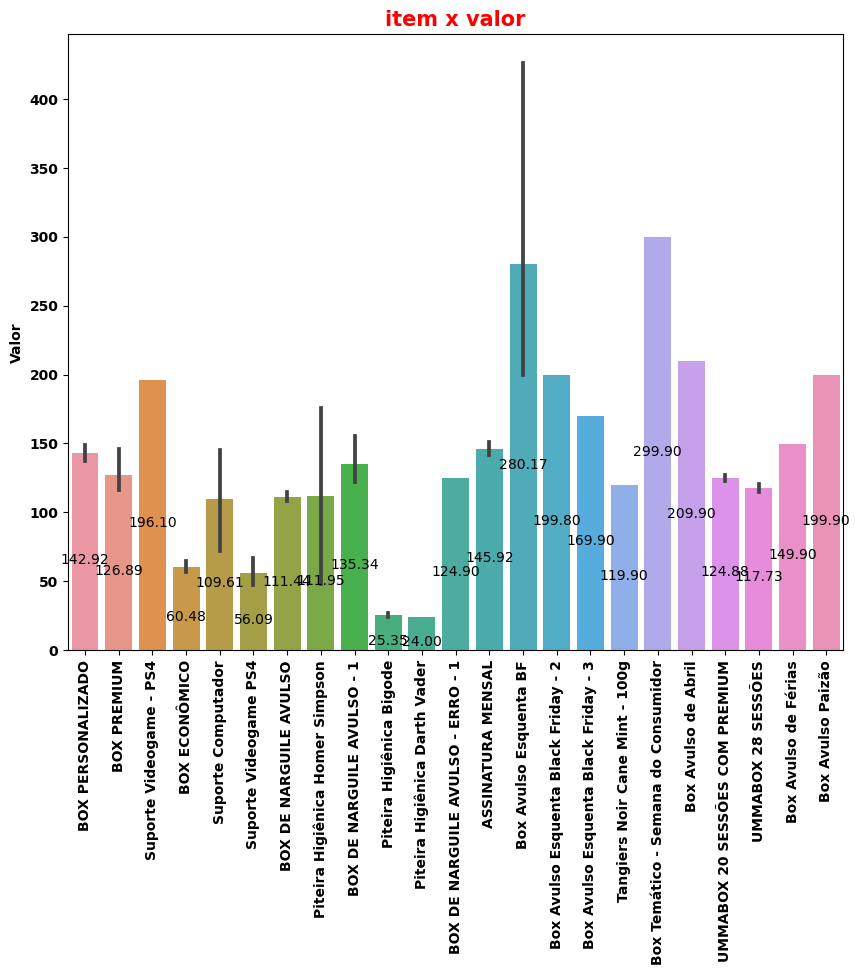

In [16]:
df_item_group, df_item_comp = analise(df, 'item')

In [17]:
df_item_group.head(10)

,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
item,,,,,,,,,,,,,,,,,,,,
ASSINATURA MENSAL,88136.20,14059.95,99097.94,610.0,9243.0,274670.859477,148.513790,2629.0,4015.0,670.0,9307.0,9243.0,118.704534,3697.714191,4004.298807,192.741430,9266.0,3134.0,55759.600968,28875.0
BOX PERSONALIZADO,67172.80,11328.19,78359.62,473.0,1330.0,45469.276708,30.025150,335.0,511.0,183.0,1358.0,1330.0,31.231058,1240.988618,632.758550,74.697282,1355.0,366.0,8130.449118,4826.0
UMMABOX 20 SESSÕES COM PREMIUM,29221.40,5860.99,34935.51,235.0,2501.0,119461.919249,50.530892,701.0,837.0,154.0,2553.0,2500.0,39.450272,1618.477322,1315.642063,77.437034,2500.0,813.0,21058.074767,8589.0
UMMABOX 28 SESSÕES,17659.80,3623.99,21270.80,151.0,1209.0,79145.401122,28.647856,314.0,411.0,77.0,1249.0,1209.0,27.825666,1029.200143,700.788095,68.467859,1209.0,391.0,15784.090954,4242.0
BOX DE NARGUILE AVULSO - 1,3924.80,745.55,4476.54,30.0,268.0,7572.980916,3.614057,118.0,91.0,13.0,274.0,268.0,3.356081,103.249603,125.833333,5.257961,268.0,114.0,1405.699689,716.0
BOX PREMIUM,3679.90,682.25,4362.15,31.0,7.0,2509.250000,0.750000,4.0,3.0,1.0,7.0,7.0,0.344455,34.750000,6.000000,2.250000,7.0,3.0,207.700000,35.0
Suporte Videogame PS4,3028.60,1142.30,4151.04,74.0,122.0,9413.084416,3.664394,101.0,68.0,17.0,123.0,122.0,3.853466,148.822619,88.666667,8.131385,122.0,27.0,1733.691089,432.0
BOX DE NARGUILE AVULSO,2897.40,667.10,3535.78,26.0,251.0,5981.999184,2.619373,126.0,137.0,14.0,251.0,251.0,2.422412,88.587507,85.333333,3.577592,251.0,60.0,1186.637290,830.0
BOX ECONÔMICO,2298.05,921.82,3219.87,39.0,88.0,1294.780808,2.276094,14.0,40.0,7.0,89.0,88.0,1.484922,45.858923,64.500000,3.111111,89.0,48.0,319.327171,217.0


In [18]:
df_item_comp

,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
item,,,,,,,,,,,,,,,,
ASSINATURA MENSAL,15.854202,471.133550,0.254741,4.509434,6.886792,1.149228,15.963979,15.854202,0.203610,6.342563,6.868437,0.330603,15.893654,5.375643,95.642540,49.528302
BOX DE NARGUILE AVULSO - 1,16.750000,473.311307,0.225879,7.375000,5.687500,0.812500,17.125000,16.750000,0.209755,6.453100,7.864583,0.328623,16.750000,7.125000,87.856231,44.750000
BOX PERSONALIZADO,7.514124,256.888569,0.169634,1.892655,2.887006,1.033898,7.672316,7.514124,0.176447,7.011235,3.574907,0.422019,7.655367,2.067797,45.934741,27.265537
BOX PREMIUM,2.333333,836.416667,0.250000,1.333333,1.000000,0.333333,2.333333,2.333333,0.114818,11.583333,2.000000,0.750000,2.333333,1.000000,69.233333,11.666667
Suporte Videogame PS4,5.545455,427.867473,0.166563,4.590909,3.090909,0.772727,5.590909,5.545455,0.175158,6.764665,4.030303,0.369608,5.545455,1.227273,78.804140,19.636364
UMMABOX 20 SESSÕES COM PREMIUM,11.066372,528.592563,0.223588,3.101770,3.703540,0.681416,11.296460,11.061947,0.174559,7.161404,5.821425,0.342642,11.061947,3.597345,93.177322,38.004425
UMMABOX 28 SESSÕES,8.224490,538.404089,0.194883,2.136054,2.795918,0.523810,8.496599,8.224490,0.189290,7.001362,4.767266,0.465768,8.224490,2.659864,107.374768,28.857143


Os items mais adquiridos são Assinaturas e box avulso. Assim como, também temos as médias das métricas de comportamento de quem comprou esses items, usaremos para definir o perfil comportamental

### - Variável: cupom

Essa variável indica qual cupom foi utilizado na compra

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\132397960.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'visualizacoes_paginas_unicas']].groupby(var).sum().sort_values(sort, ascending  = False)


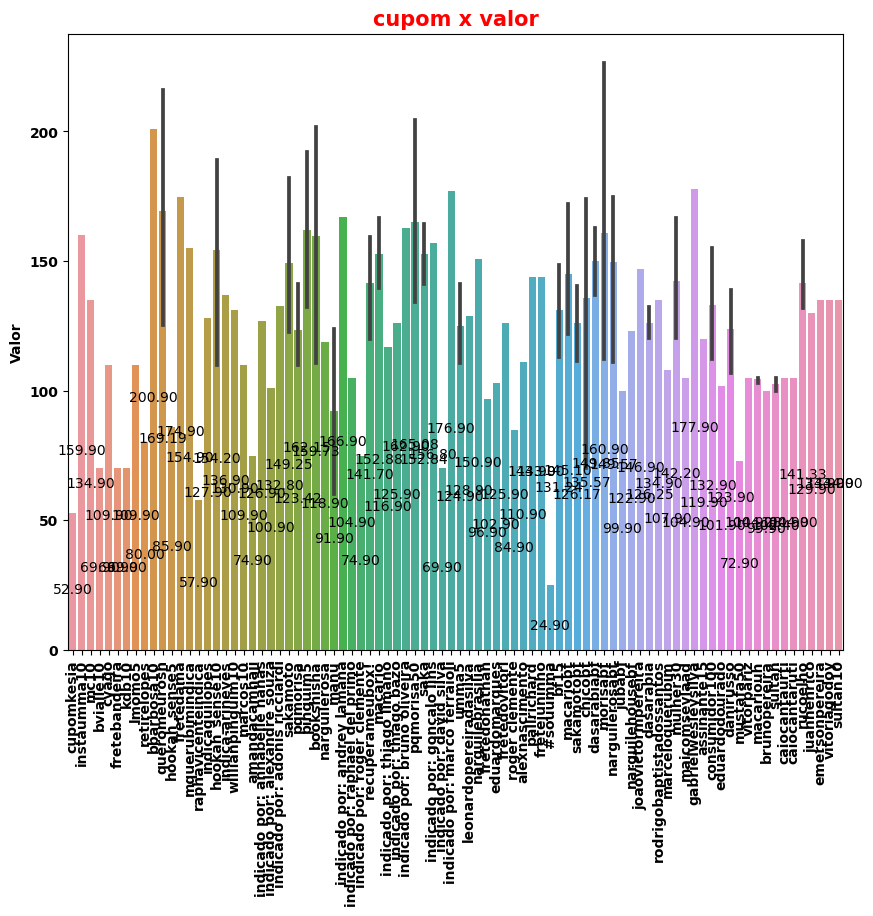

In [19]:
df_cupom_group, df_cupom_comp = analise(df, 'cupom')

In [20]:
df_cupom_group.head(10)

,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
cupom,,,,,,,,,,,,,,,,,,,,
macario,11160.0,1601.87,12665.44,76.0,889.0,34466.893500,14.398949,344.0,463.0,78.0,894.0,889.0,13.026966,489.844980,428.385714,25.078114,892.0,273.0,6329.900723,2845.0
saka,11157.6,1733.40,12891.00,74.0,1141.0,31475.750473,19.114982,309.0,551.0,84.0,1146.0,1141.0,15.281166,413.761415,441.657540,21.270260,1143.0,409.0,7098.323243,3555.0
umma5,5245.7,1005.30,5988.92,42.0,728.0,18534.614865,11.037340,253.0,372.0,50.0,728.0,728.0,7.993879,243.359327,331.627778,10.553263,728.0,290.0,3673.637515,2156.0
dasarabia,4671.3,917.21,5561.53,37.0,457.0,20717.105249,8.468408,127.0,167.0,27.0,462.0,457.0,6.367296,303.249659,179.285714,10.561387,457.0,166.0,3636.851433,1650.0
sakamoto,4328.3,664.63,4992.93,29.0,98.0,7480.131061,2.137121,33.0,78.0,14.0,108.0,98.0,2.862961,129.384848,52.833333,8.774242,99.0,23.0,1316.496125,415.0
bf15,3806.1,656.26,3891.59,29.0,603.0,14201.447698,7.185195,126.0,396.0,39.0,606.0,603.0,5.417506,177.574171,224.372222,7.996821,603.0,239.0,2758.917557,1714.0
mulher30,3270.7,530.53,2820.02,23.0,340.0,9612.532968,6.176893,139.0,128.0,27.0,351.0,340.0,5.041863,151.923275,111.183333,6.655968,340.0,125.0,1891.430665,1078.0
macariobf,2902.0,463.61,2930.41,20.0,534.0,6995.473023,5.044981,125.0,199.0,36.0,534.0,534.0,3.395778,112.698281,231.592424,5.924197,534.0,169.0,1408.632685,1720.0
pqmorisa,2838.6,527.36,3258.54,24.0,136.0,10814.870269,3.699939,65.0,52.0,18.0,137.0,136.0,2.877025,175.699206,60.416667,9.217094,137.0,38.0,1472.351408,543.0


In [21]:
df_cupom_comp

,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
cupom,,,,,,,,,,,,,,,,
bf15,21.535714,507.194561,0.256614,4.500000,14.142857,1.392857,21.642857,21.535714,0.193482,6.341935,8.013294,0.285601,21.535714,8.535714,98.532770,61.214286
dasarabia,12.351351,559.921763,0.228876,3.432432,4.513514,0.729730,12.486486,12.351351,0.172089,8.195937,4.845560,0.285443,12.351351,4.486486,98.293282,44.594595
macario,12.884058,499.520196,0.208680,4.985507,6.710145,1.130435,12.956522,12.884058,0.188797,7.099203,6.208489,0.363451,12.927536,3.956522,91.737692,41.231884
mulher30,16.190476,457.739665,0.294138,6.619048,6.095238,1.285714,16.714286,16.190476,0.240089,7.234442,5.294444,0.316951,16.190476,5.952381,90.068127,51.333333
saka,16.070423,443.320429,0.269225,4.352113,7.760563,1.183099,16.140845,16.070423,0.215228,5.827626,6.220529,0.299581,16.098592,5.760563,99.976384,50.070423
sakamoto,5.444444,415.562837,0.118729,1.833333,4.333333,0.777778,6.000000,5.444444,0.159053,7.188047,2.935185,0.487458,5.500000,1.277778,73.138674,23.055556
umma5,18.200000,463.365372,0.275934,6.325000,9.300000,1.250000,18.200000,18.200000,0.199847,6.083983,8.290694,0.263832,18.200000,7.250000,91.840938,53.900000


Os cupons mais utilizados são de black friday, dasarabias, macario umma5, sakamoto e dia da mulher. Assim como, também temos as médias das métricas de comportamento de quem os usou, usaremos para definir o perfil comportamental

### - Variável: Estado

Indica o estado do assinante

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\132397960.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'visualizacoes_paginas_unicas']].groupby(var).sum().sort_values(sort, ascending  = False)


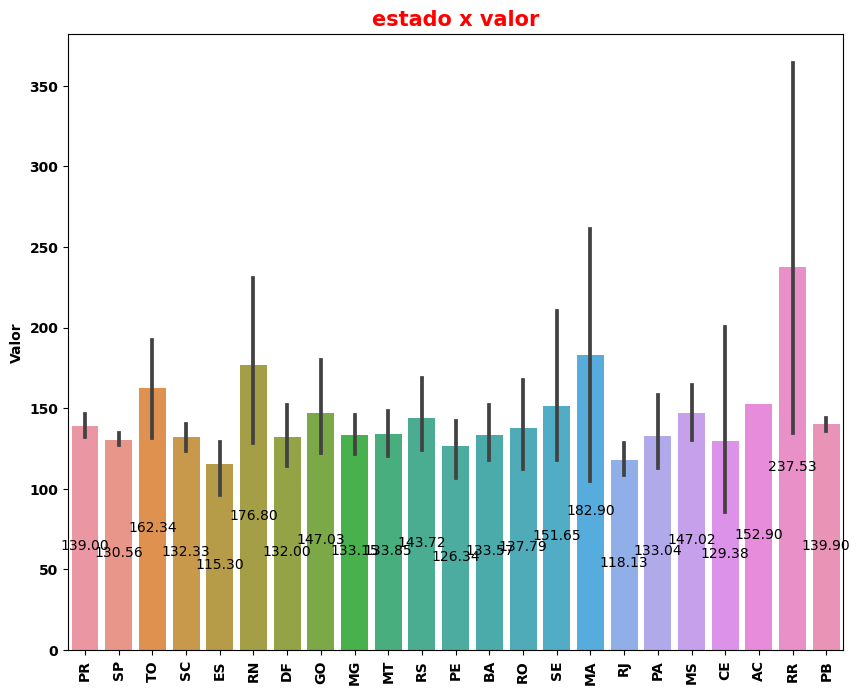

In [22]:
df_estado_group, df_estado_comp = analise(df, 'estado')

In [23]:
df_estado_group.head(10)

,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
estado,,,,,,,,,,,,,,,,,,,,
SP,115415.45,16707.16,130187.11,891.0,8984.0,276903.629147,158.268457,2360.0,3481.0,685.0,9117.0,8983.0,128.531694,4175.623997,4138.156804,215.911580,9016.0,3034.0,56941.201243,28705.0
PR,39338.00,7372.99,46130.43,291.0,1972.0,93870.375669,35.684254,655.0,883.0,165.0,1992.0,1972.0,33.945388,1426.700151,930.623016,85.092658,1978.0,582.0,16070.501127,6709.0
SC,20510.80,4080.65,24285.81,164.0,1218.0,50110.342932,22.888309,423.0,494.0,88.0,1223.0,1218.0,20.927913,714.995276,601.904762,44.239578,1219.0,460.0,9918.458499,3727.0
GO,7939.60,1681.99,9281.90,58.0,399.0,21427.195424,9.063329,168.0,161.0,27.0,405.0,399.0,7.179291,257.299194,190.797619,14.724105,403.0,140.0,4417.942589,1333.0
DF,7127.80,1612.84,8674.63,60.0,444.0,20893.863799,8.132313,164.0,263.0,34.0,447.0,444.0,6.383827,282.749392,192.982540,11.255965,445.0,120.0,3268.801933,1607.0
MG,6524.40,1354.72,7829.58,51.0,460.0,18010.478517,5.874019,105.0,152.0,28.0,462.0,460.0,6.656908,299.727104,175.433333,17.946179,461.0,119.0,2926.084404,1574.0
MT,5621.70,1727.57,7248.04,43.0,355.0,16851.116469,8.218521,98.0,204.0,19.0,356.0,355.0,5.603371,229.140896,189.570393,11.764578,355.0,111.0,2854.550016,1329.0
RS,4886.50,1012.34,5790.43,34.0,252.0,11343.951500,4.926987,79.0,72.0,17.0,253.0,252.0,4.312870,186.904174,108.116667,8.352863,253.0,83.0,1789.819628,760.0
MS,3528.40,753.67,4199.79,24.0,137.0,13133.168483,4.860211,87.0,85.0,18.0,141.0,137.0,3.853107,149.567186,97.250000,9.021703,139.0,39.0,2356.005080,518.0


In [24]:
df_estado_comp

,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
estado,,,,,,,,,,,,,,,,
DF,12.000000,564.699022,0.219792,4.432432,7.108108,0.918919,12.081081,12.000000,0.172536,7.641875,5.215744,0.304215,12.027027,3.243243,88.345998,43.432432
GO,10.500000,563.873564,0.238509,4.421053,4.236842,0.710526,10.657895,10.500000,0.188929,6.771031,5.020990,0.387476,10.605263,3.684211,116.261647,35.078947
MG,11.794872,461.807141,0.150616,2.692308,3.897436,0.717949,11.846154,11.794872,0.170690,7.685310,4.498291,0.460158,11.820513,3.051282,75.027805,40.358974
MT,11.093750,526.597390,0.256829,3.062500,6.375000,0.593750,11.125000,11.093750,0.175105,7.160653,5.924075,0.367643,11.093750,3.468750,89.204688,41.531250
PR,10.217617,486.375003,0.184893,3.393782,4.575130,0.854922,10.321244,10.217617,0.175883,7.392229,4.821881,0.440895,10.248705,3.015544,83.266845,34.761658
SC,11.490566,472.739084,0.215927,3.990566,4.660377,0.830189,11.537736,11.490566,0.197433,6.745238,5.678347,0.417355,11.500000,4.339623,93.570363,35.160377
SP,13.800307,425.351197,0.243116,3.625192,5.347158,1.052227,14.004608,13.798771,0.197437,6.414169,6.356616,0.331661,13.849462,4.660522,87.467283,44.093702


Os estados com mais compras são SP, PR, SC e GO/DF. Vejamos as cidades também

### - Variável: Cidade

Indica o cidade do assinante

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\997859051.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.barplot(data = df.groupby('cidade', as_index = False).sum().sort_values('valor', ascending = False)[:30],


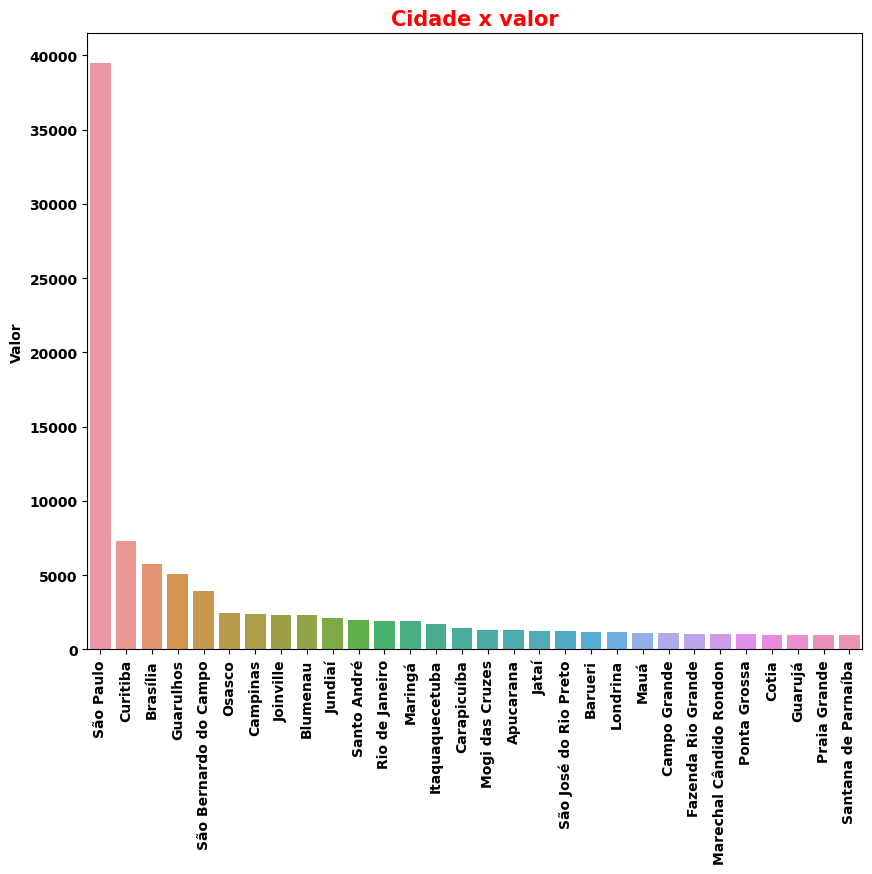

In [25]:
fig, ax = plt.subplots(figsize=(10, 8))

# add the plot
sns.barplot(data = df.groupby('cidade', as_index = False).sum().sort_values('valor', ascending = False)[:30],
            x = 'cidade', y = 'valor')
plt.title("Cidade x valor", weight="bold", c="red", fontsize=15)
plt.xlabel("",weight="bold",c="k")
plt.xticks(rotation=0, weight="bold")
plt.ylabel("Valor",weight= "bold",c="k")
plt.yticks(weight="bold")

# add the annotation
#ax.bar_label(ax.containers[-1], fmt='\n%.2f', label_type='center')
plt.xticks(rotation = 90)
plt.show()

In [26]:
df_cidade_group = df[['valor', 'valor_frete', 'valor_total', 
                      'item','quantidade', 'cupom', 'onde_conheceu', 'cidade', 'estado',
                       'sessoes', 'duracao_media_sessao', 'taxa_rejeicao',
                       'check_outs', 'visualizacoes_produto','pesquisas_organicas',
                       'comb_dimensoes_exclusivas', 'entradas',
                       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
                       'sessoes_por_usuario', 'taxa_novas_sessoes', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
                       'visualizacoes_paginas_unicas']].groupby('cidade').sum().sort_values('valor', ascending  = False)
df_cidade_group.head(10)

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\3084028450.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'visualizacoes_paginas_unicas']].groupby('cidade').sum().sort_values('valor', ascending  = False)


,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
cidade,,,,,,,,,,,,,,,,,,,,
São Paulo,39498.85,5644.14,44532.18,305.0,3272.0,92745.908634,55.412486,837.0,1267.0,261.0,3319.0,3272.0,43.909817,1522.135202,1436.726010,82.451643,3289.0,1125.0,18554.482861,10757.0
Curitiba,7316.70,1199.28,8351.52,54.0,307.0,16127.972809,4.900133,91.0,169.0,32.0,311.0,307.0,6.273830,254.298639,141.744444,16.771976,309.0,46.0,2974.541329,1299.0
Brasília,5724.00,1307.10,6980.37,49.0,440.0,20626.113799,7.632313,162.0,262.0,32.0,443.0,440.0,6.235678,275.999392,190.982540,11.005965,441.0,118.0,3222.236716,1589.0
Guarulhos,5051.80,710.54,5732.38,41.0,492.0,18225.009334,6.295830,110.0,149.0,54.0,498.0,492.0,6.355708,246.277773,228.716667,13.005544,493.0,146.0,3343.974601,1692.0
São Bernardo do Campo,3923.30,471.01,4378.88,26.0,193.0,6707.248633,5.078402,62.0,56.0,28.0,197.0,193.0,4.327752,120.357487,82.487179,8.789958,197.0,70.0,1788.416873,634.0
Osasco,2446.00,350.77,2713.71,20.0,287.0,12966.621665,4.070529,59.0,87.0,33.0,314.0,287.0,3.996886,106.431543,80.825758,5.156226,287.0,110.0,2619.729580,842.0
Campinas,2357.90,305.23,2655.94,17.0,74.0,2435.379085,2.639122,54.0,19.0,6.0,75.0,74.0,2.177233,49.418067,38.700000,1.685808,74.0,24.0,539.430447,231.0
Joinville,2322.10,418.24,2681.88,17.0,130.0,5253.705530,1.823528,62.0,70.0,15.0,131.0,130.0,1.624440,83.094009,51.361111,5.205402,131.0,34.0,817.374432,471.0
Blumenau,2291.00,412.18,2692.70,16.0,154.0,2847.007657,2.722741,50.0,57.0,5.0,155.0,154.0,1.975242,57.703950,76.250000,3.151407,154.0,78.0,580.084100,408.0


In [27]:
df_cidade_comp = df[df['cidade'].isin(df_cidade_group.index[:7])][['cidade', 'sessoes', 'duracao_media_sessao', 'taxa_rejeicao',
                       'check_outs', 'visualizacoes_produto','pesquisas_organicas',
                       'comb_dimensoes_exclusivas', 'entradas',
                       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
                       'sessoes_por_usuario', 'taxa_novas_sessoes', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
                       'visualizacoes_paginas_unicas']].groupby('cidade').mean()

In [28]:
df_cidade_comp

,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,visualizacoes_produto,pesquisas_organicas,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,taxa_novas_sessoes,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas
cidade,,,,,,,,,,,,,,,,
Brasília,12.222222,572.947606,0.212009,4.500000,7.277778,0.888889,12.305556,12.222222,0.173213,7.666650,5.305071,0.305721,12.250000,3.277778,89.506575,44.138889
Campinas,8.222222,270.597676,0.293236,6.000000,2.111111,0.666667,8.333333,8.222222,0.241915,5.490896,4.300000,0.187312,8.222222,2.666667,59.936716,25.666667
Curitiba,8.297297,435.891157,0.132436,2.459459,4.567568,0.864865,8.405405,8.297297,0.169563,6.872936,3.830931,0.453297,8.351351,1.243243,80.393009,35.108108
Guarulhos,13.666667,506.250259,0.174884,3.055556,4.138889,1.500000,13.833333,13.666667,0.176547,6.841049,6.353241,0.361265,13.694444,4.055556,92.888183,47.000000
Osasco,16.882353,762.742451,0.239443,3.470588,5.117647,1.941176,18.470588,16.882353,0.235111,6.260679,4.754456,0.303307,16.882353,6.470588,154.101740,49.529412
São Bernardo do Campo,9.190476,319.392792,0.241829,2.952381,2.666667,1.333333,9.380952,9.190476,0.206083,5.731309,3.927961,0.418569,9.380952,3.333333,85.162708,30.190476
São Paulo,14.164502,401.497440,0.239881,3.623377,5.484848,1.129870,14.367965,14.164502,0.190086,6.589330,6.219593,0.356934,14.238095,4.870130,80.322437,46.567100


Assim, temos as cidades com mais compras e o comportamento de quem reside nas mesmas

### Variáveis de comportamento no site: 

- **Sessões**: O número total de sessões no intervalo de datas. Uma sessão é o período de tempo em que um utilizador está a interagir ativamente com o seu Website, aplicação, etc. Todos os dados de utilização (Visualizações de ecrã, Eventos, Comércio eletrónico, etc.) são associados a uma sessão.

-  **Duração média da sessões**: A duração média de uma sessão.

- **Check outs**: Número de vezes que o produto foi incluído no processo de checkout.

- **Taxa de rejeição**: A percentagem de sessões de página única nas quais não existiu interação com a página. Uma sessão rejeitada tem uma duração de 0 segundos.
 
- **Pesquisas orgânicas**: O número de pesquisas orgânicas ocorridas numa sessão.
 
 - **Combinações de dimensões exclusivas**: Uma contagem do número de vezes que um conjunto exclusivo de valores de dimensão foi visto pelo menos uma vez em uma sessão
 
- **Entradas**: Número de vezes que os visitantes acederam ao seu site através de uma página específica ou de um conjunto de páginas.

- **Visualizações de produtos**: Número de vezes que os usuários visualizaram a página de detalhes do produto.

- **Receita**

- **Transações**

- **Páginas por sessão**: Páginas/Sessão (média de páginas visitadas) corresponde ao número médio de páginas visualizadas durante uma sessão. São contabilizadas as visualizações repetidas de uma única página.

- **Sessões por usuário**: Número médio de sessões por utilizador.

- **Taxa de novas sessões**: Uma estimativa da percentagem de primeiras visitas.

- **Saídas**: Número de vezes que os visitantes saíram do seu site a partir de uma página específica ou de um conjunto de páginas.

- **Rejeições**: Número de visitas de página única.

- **Tempo médio na página**: A média de tempo que os utilizadores passaram a ver uma página ou ecrã ou um conjunto de páginas ou de ecrãs especificado.

- **Visualizações de páginas únicas**: Visualizações de página únicas é o número de sessões durante as quais a página especificada foi visualizada pelo menos uma vez. É contabilizada uma visualização de página única para cada combinação de URL de página + Título da página.


In [29]:
def analise_comportamento(df, var, agg = 'comprou', valor = 'valor'):
    df_agrupado_0 = df[(df[agg] == 0)].groupby([var] ).count()[agg].reset_index()
    df_agrupado_1 = df[(df[agg] == 1)].groupby([var] ).count()[agg].reset_index()
    
    df_agrupado_1[var+'_nao'] = df_agrupado_0[var]
    df_agrupado_1['contagem_nao_comprou'] = df_agrupado_0[agg]
    df_agrupado_1.fillna(0,inplace = True)
    
    fig, ax = plt.subplots(1,2,figsize=(12, 6))

    # add the plot
    sns.scatterplot(df_agrupado_1, x = var, y = agg, ax = ax[0])
    sns.scatterplot(df_agrupado_1, x = var+'_nao', y = 'contagem_nao_comprou', ax = ax[1])

    # add the annotation
    #ax.bar_label(ax.containers[-1], fmt='\n%.f', label_type='edge')
    plt.xticks(rotation=45, weight="bold")
    plt.show()
    
    return df_agrupado_1

### - Sessões

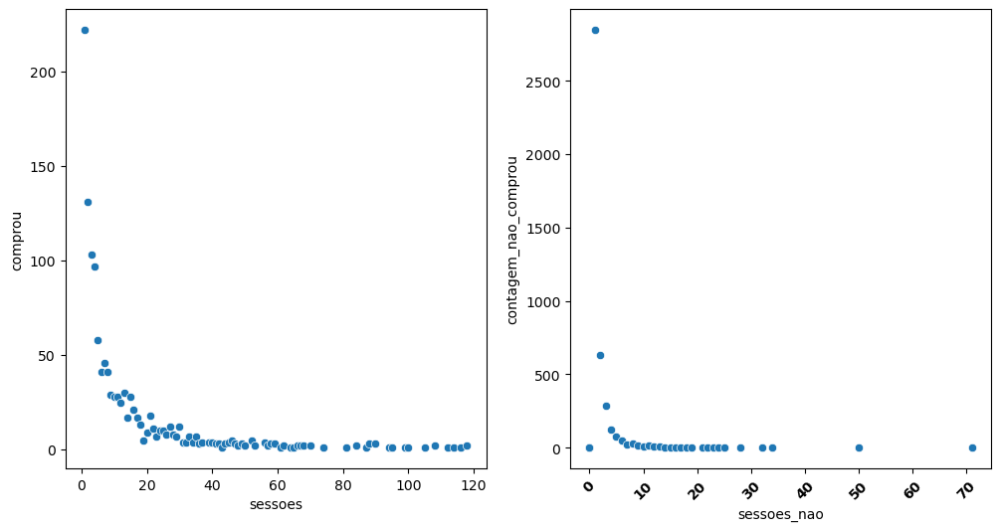

,sessoes,comprou,sessoes_nao,contagem_nao_comprou
0,1.0,222,1.0,2847.0
1,2.0,131,2.0,633.0
2,3.0,103,3.0,283.0
3,4.0,97,4.0,124.0
4,5.0,58,5.0,74.0
5,6.0,41,6.0,50.0
6,7.0,46,7.0,23.0
7,8.0,41,8.0,26.0
8,9.0,29,9.0,13.0
9,10.0,28,10.0,8.0


In [30]:
df_sessoes = analise_comportamento(df, 'sessoes')
df_sessoes.head(10)

Pode-se notar a influência dos outliers. As pessoas que costumam comprar, utilizam de mais sessões (maioria até 10). Isso indica que tiram suas dúvidas em mais acessos e fora do site também. Enquanto as pessoas que não comprarm, em sua maioria, saem com até 3 sessões, indicando que ainda não estão prontas para comprar e vão buscar mais informações.

## - Duração média da sessão

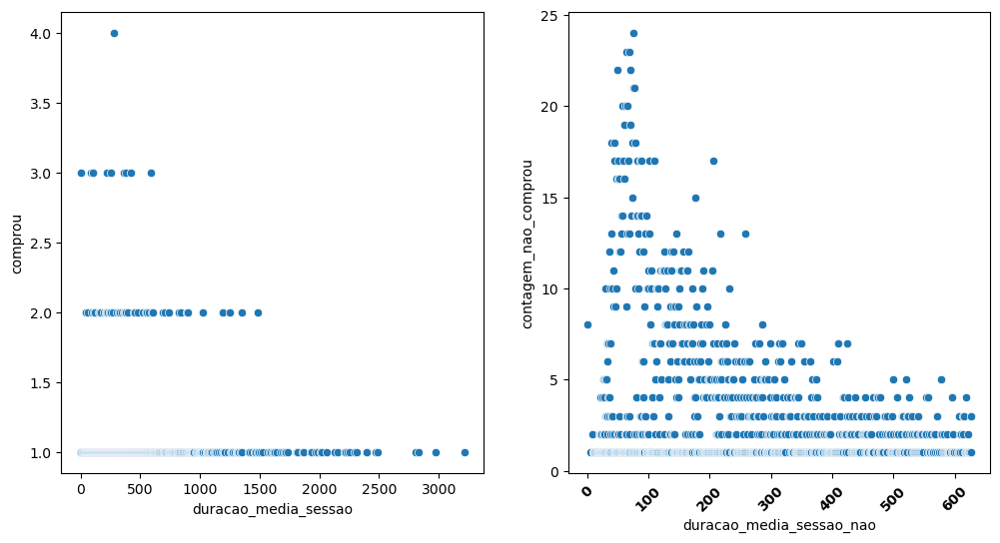

,duracao_media_sessao,comprou,duracao_media_sessao_nao,contagem_nao_comprou
0,0.000000,3,0.000000,8
1,6.285714,1,5.000000,1
2,6.500000,1,9.000000,2
3,13.000000,1,10.250000,1
4,16.830769,1,10.750000,1
5,18.545455,1,11.000000,1
6,22.300000,1,11.166667,1
7,24.520000,1,11.200000,1
8,25.500000,1,12.333333,1
9,34.500000,1,13.000000,1


In [31]:
df_duracao_media_sessao = analise_comportamento(df, 'duracao_media_sessao')
df_duracao_media_sessao.head(10)

Pode-se notar a influência dos outliers. As pessoas que costumam comprar, utilizam de mais tempo no site de modo geral para tirar suas dúvidas. Enquanto as pessoas que não comprarm, apresentam um comportamento mais generalizado indicando ainda não estarem prontas para a compra

## - Taxa de rejeição

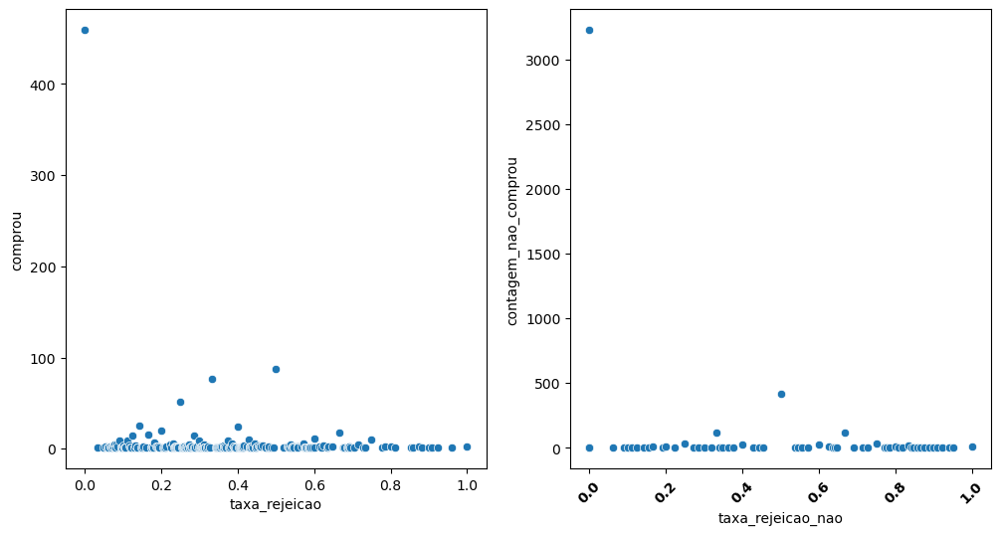

,taxa_rejeicao,comprou,taxa_rejeicao_nao,contagem_nao_comprou
0,0.000000,459,0.000000,3224.0
1,0.032258,1,0.062500,1.0
2,0.050000,1,0.090909,1.0
3,0.055556,2,0.100000,1.0
4,0.058824,1,0.111111,2.0
5,0.062500,1,0.125000,1.0
6,0.066667,3,0.142857,4.0
7,0.070175,1,0.154930,1.0
8,0.071429,2,0.166667,7.0
9,0.074074,2,0.190476,1.0


In [32]:
df_taxa_rejeicao = analise_comportamento(df, 'taxa_rejeicao')
df_taxa_rejeicao.head(10)

Também temos outliers, possivelmente dos mesmos usuários das outras variáveis. Para os usuários que compraram, temos taxas de rejeitções baixa. Por outro lado, que não comprou tende a ter taxas maiores. Temos uma alta quantidade de usuários com uma taxa igual a 0, indicando que a navegabilidade e informações do site são bons e impactam tanto pagantes como não pagantes.

## - Check outs

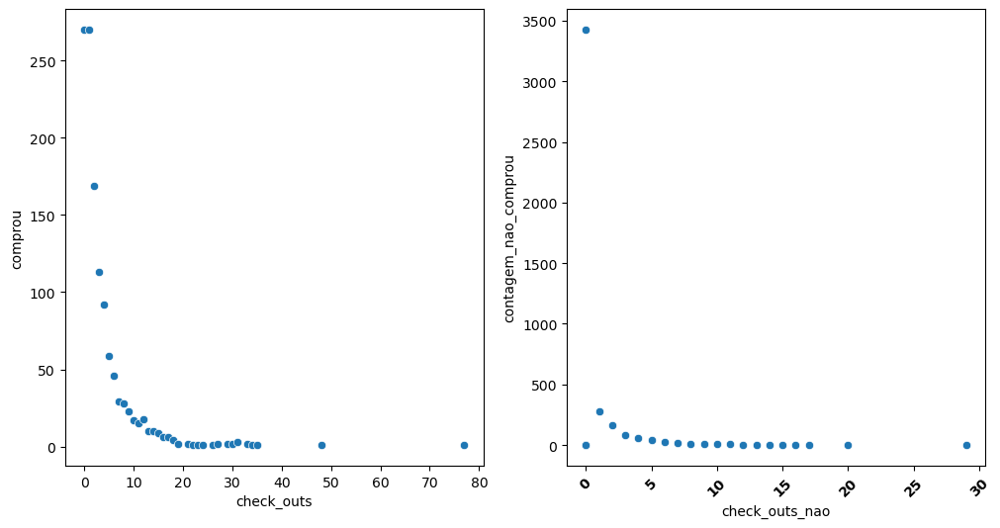

,check_outs,comprou,check_outs_nao,contagem_nao_comprou
0,0.0,270,0.0,3426.0
1,1.0,270,1.0,281.0
2,2.0,169,2.0,163.0
3,3.0,113,3.0,84.0
4,4.0,92,4.0,54.0
5,5.0,59,5.0,38.0
6,6.0,46,6.0,27.0
7,7.0,29,7.0,17.0
8,8.0,28,8.0,8.0
9,9.0,23,9.0,8.0


In [33]:
df_check_outs = analise_comportamento(df, 'check_outs')
df_check_outs.head(10)

Outliers novamente aqui. As pessoas que compram, fazem menos check outs, o que pode ser um indicativo de irem ao check out após estarem prontas para comprar ou com poucas dúvidas. Enquanto as pessoas que não comprarm, tem muitos check outs, idas e vindas no site por ainda estarem com muitas dúvidas para comprar.

## - Visualizações de produto

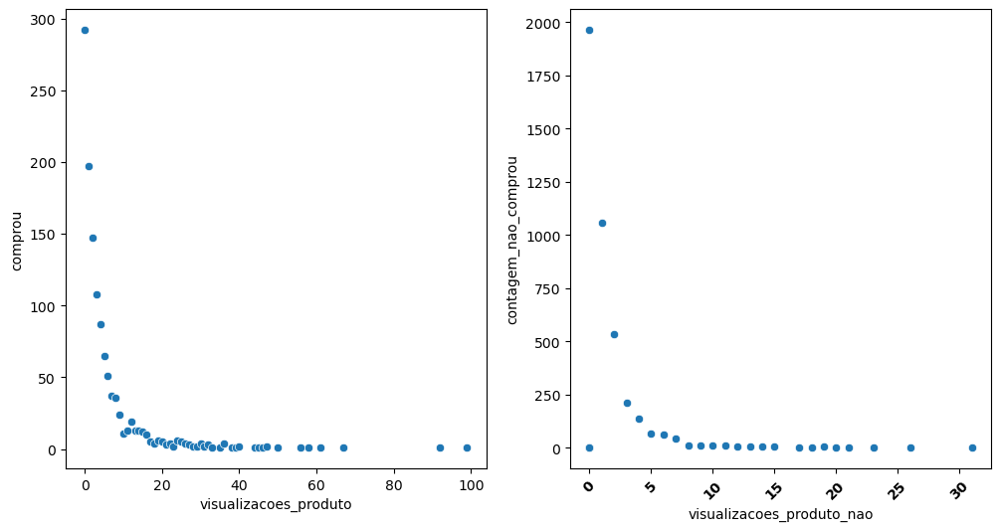

,visualizacoes_produto,comprou,visualizacoes_produto_nao,contagem_nao_comprou
0,0.0,292,0.0,1963.0
1,1.0,197,1.0,1056.0
2,2.0,147,2.0,532.0
3,3.0,108,3.0,210.0
4,4.0,87,4.0,136.0
5,5.0,65,5.0,64.0
6,6.0,51,6.0,59.0
7,7.0,37,7.0,41.0
8,8.0,36,8.0,12.0
9,9.0,24,9.0,11.0


In [34]:
df_visualizacoes_produto = analise_comportamento(df, 'visualizacoes_produto')
df_visualizacoes_produto.head(10)

As pessoas que não compraram, visualizam muito mais os produtos ou nem visualizam por estarem perdidas nas dúvidas ou no site. Uma indicação que ainda não se decidiram e estão com dúvidas

## - Pesquisas orgânicas

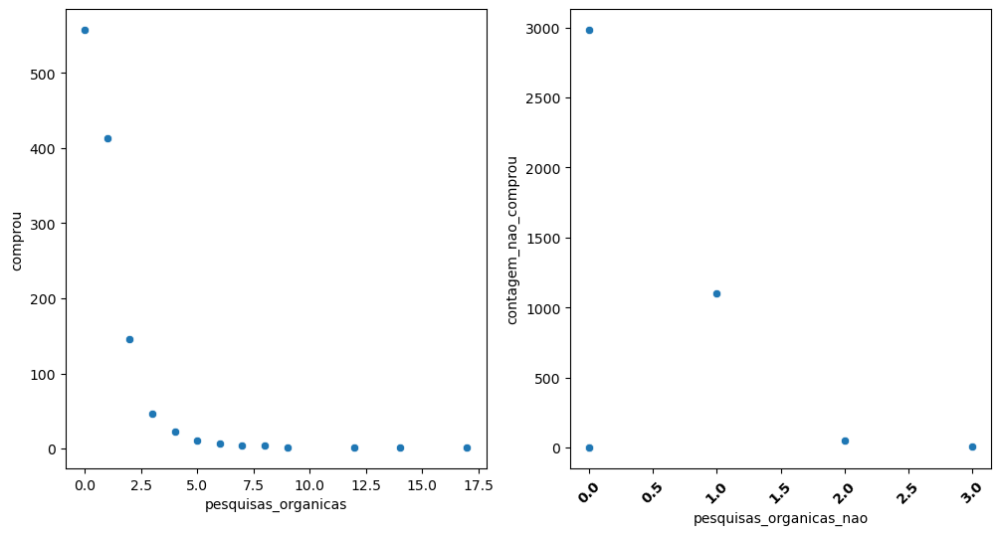

,pesquisas_organicas,comprou,pesquisas_organicas_nao,contagem_nao_comprou
0,0.0,557,0.0,2980.0
1,1.0,413,1.0,1100.0
2,2.0,146,2.0,49.0
3,3.0,47,3.0,7.0
4,4.0,23,0.0,0.0
5,5.0,11,0.0,0.0
6,6.0,7,0.0,0.0
7,7.0,4,0.0,0.0
8,8.0,4,0.0,0.0
9,9.0,2,0.0,0.0


In [35]:
df_pesquisas_organicas = analise_comportamento(df, 'pesquisas_organicas')
df_pesquisas_organicas.head(10)

O número de pesquisas orgânicas ocorridas numa sessão ocorre menos vezes para quem compra por já estarem mais preparados para realizar a compra e sem dúvidas

## - Combinações de dimensões exclusivas

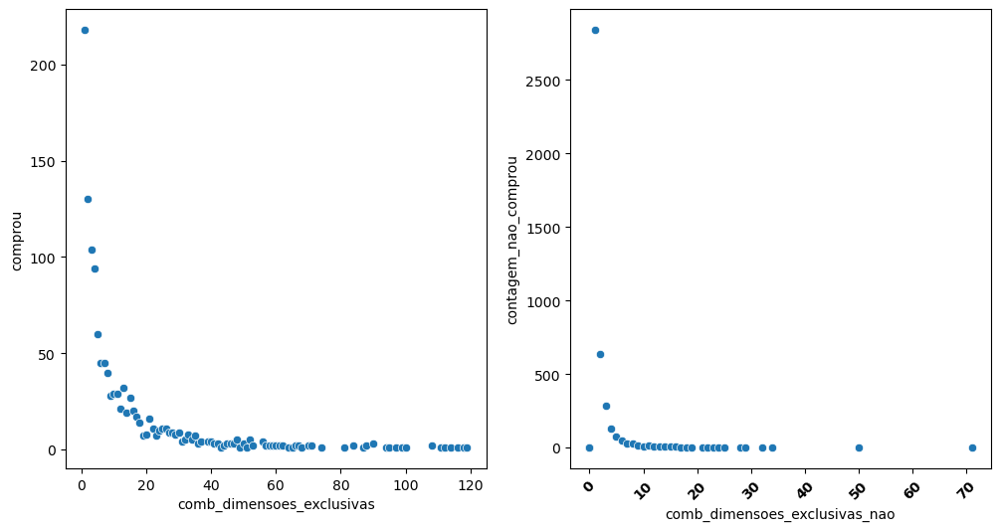

,comb_dimensoes_exclusivas,comprou,comb_dimensoes_exclusivas_nao,contagem_nao_comprou
0,1.0,218,1.0,2839.0
1,2.0,130,2.0,633.0
2,3.0,104,3.0,282.0
3,4.0,94,4.0,129.0
4,5.0,60,5.0,77.0
5,6.0,45,6.0,49.0
6,7.0,45,7.0,25.0
7,8.0,40,8.0,26.0
8,9.0,28,9.0,12.0
9,10.0,29,10.0,9.0


In [36]:
df_comb_dimensoes_exclusivas = analise_comportamento(df, 'comb_dimensoes_exclusivas')
df_comb_dimensoes_exclusivas.head(10)

Uma contagem do número de vezes que um conjunto exclusivo de valores das variáveis foi visto pelo menos uma vez em uma sessão. Ou seja, as pessoas que compram tendem a ter maiores números dessa variável por exercerem mais ações e realizarem a compra no site

## - Entradas

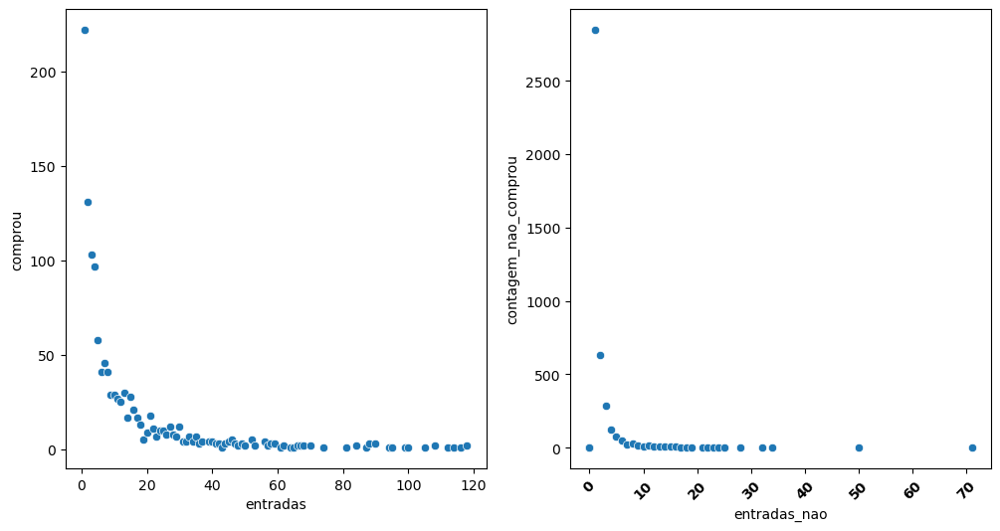

,entradas,comprou,entradas_nao,contagem_nao_comprou
0,1.0,222,1.0,2847.0
1,2.0,131,2.0,633.0
2,3.0,103,3.0,283.0
3,4.0,97,4.0,125.0
4,5.0,58,5.0,73.0
5,6.0,41,6.0,50.0
6,7.0,46,7.0,23.0
7,8.0,41,8.0,26.0
8,9.0,29,9.0,13.0
9,10.0,29,10.0,8.0


In [37]:
df_entradas = analise_comportamento(df, 'entradas')
df_entradas.head(10)

Número de vezes que os visitantes entreram ao seu site. Os usuários que compram podem ser dividios em dois: os resolvidos que entram poucas vezes para comprar diretamente e os indecisos que acessam um número maior de vezes. Em quanto os que não compram, costumam acessar menos vezes

## - Entradas com visualizações por páginas

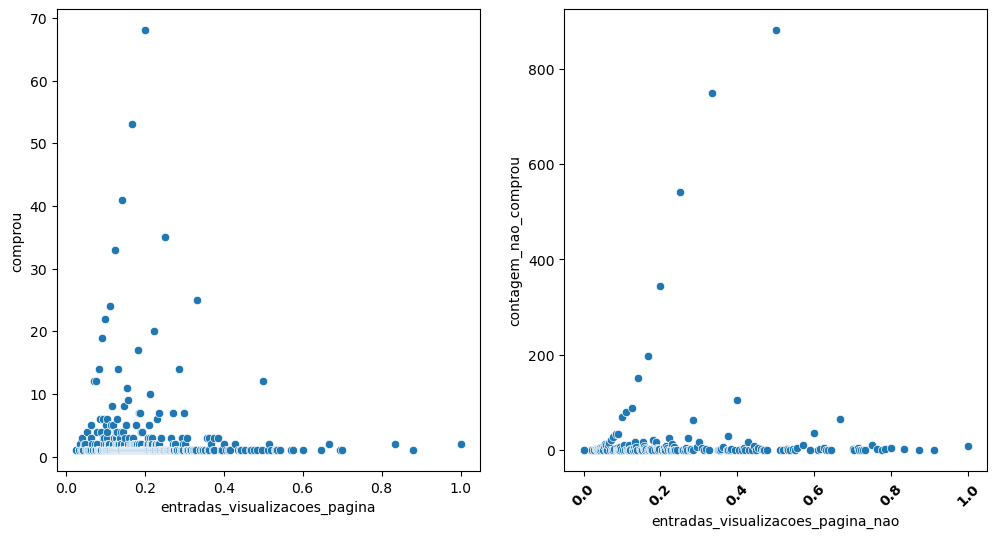

,entradas_visualizacoes_pagina,comprou,entradas_visualizacoes_pagina_nao,contagem_nao_comprou
0,0.026316,1,0.018519,1.0
1,0.033333,1,0.021277,1.0
2,0.034483,1,0.027027,1.0
3,0.037037,2,0.028571,1.0
4,0.038462,1,0.031250,2.0
5,0.040000,3,0.032258,2.0
6,0.041667,1,0.034483,2.0
7,0.042553,1,0.035714,1.0
8,0.043478,1,0.037037,1.0
9,0.045455,2,0.038462,3.0


In [38]:
df_entradas_visualizacoes_pagina = analise_comportamento(df, 'entradas_visualizacoes_pagina')
df_entradas_visualizacoes_pagina.head(10)

Percentagem de visualizações de página que resultaram em entradas no site. Para os compradores, temos um percentual maior

## - Páginas por sessões

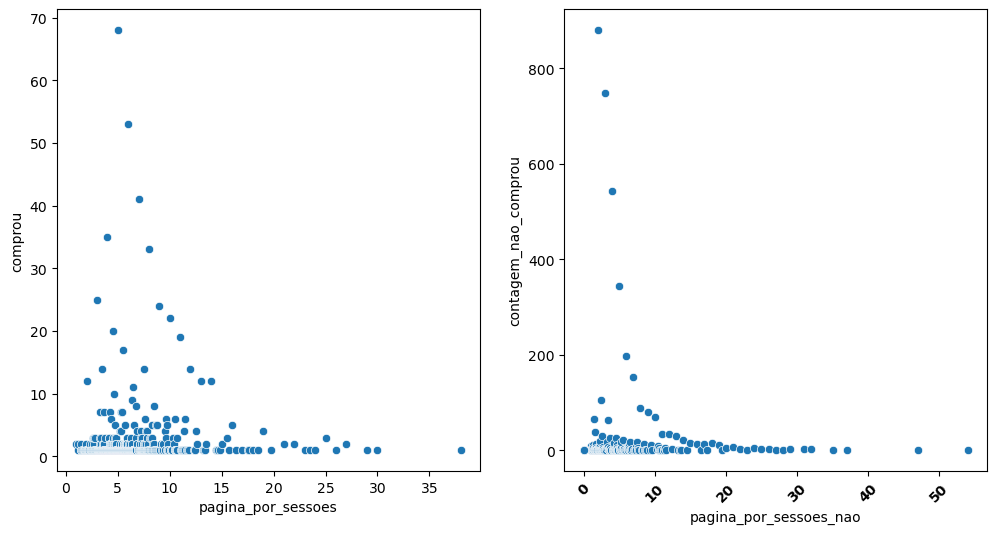

,pagina_por_sessoes,comprou,pagina_por_sessoes_nao,contagem_nao_comprou
0,1.000000,2,1.000000,9.0
1,1.138462,1,1.095238,1.0
2,1.200000,2,1.147059,1.0
3,1.428571,1,1.200000,2.0
4,1.437500,1,1.250000,5.0
5,1.500000,2,1.272727,2.0
6,1.545455,1,1.285714,1.0
7,1.666667,1,1.307692,2.0
8,1.739130,1,1.333333,11.0
9,1.750000,1,1.363636,1.0


In [39]:
df_pagina_por_sessoes = analise_comportamento(df, 'pagina_por_sessoes')
df_pagina_por_sessoes.head(10)

Páginas/Sessão (média de páginas visitadas) corresponde ao número médio de páginas visualizadas durante uma sessão. São contabilizadas as visualizações repetidas de uma única página. Para os compradores, temos um número maior nessa variável também

## - Sessões por usuário

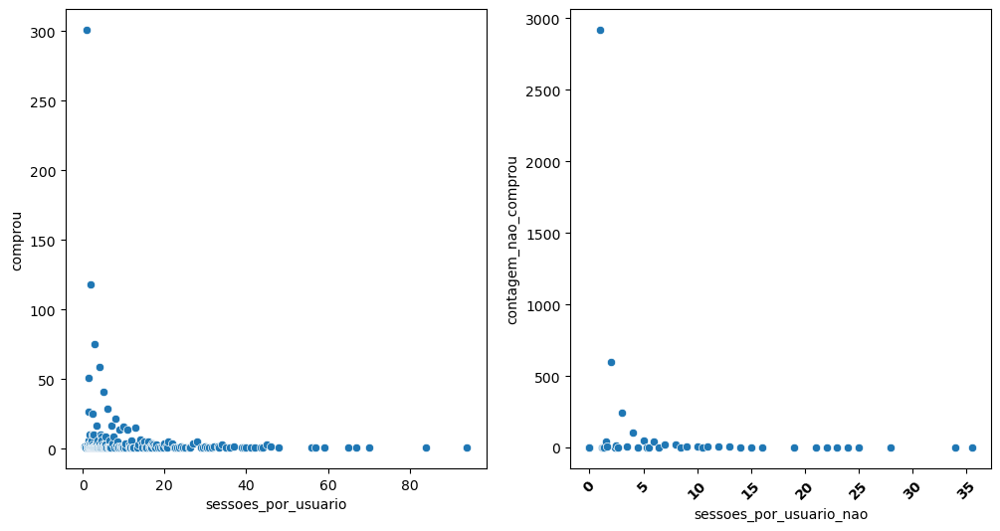

,sessoes_por_usuario,comprou,sessoes_por_usuario_nao,contagem_nao_comprou
0,0.500000,2,1.000000,2919.0
1,0.666667,1,1.200000,1.0
2,0.833333,1,1.250000,2.0
3,1.000000,301,1.333333,2.0
4,1.090909,1,1.500000,39.0
5,1.142857,1,1.666667,7.0
6,1.153846,1,2.000000,598.0
7,1.166667,3,2.333333,2.0
8,1.200000,2,2.500000,15.0
9,1.250000,3,2.666667,2.0


In [40]:
df_sessoes_por_usuario = analise_comportamento(df, 'sessoes_por_usuario')
df_sessoes_por_usuario.head(10)

Aqui já podemos ver que para os usuários preparados para a realizar a compra, temos um número menor dessa taxa. Enquanto para os não preparados, sao maiores

## - Taxa de novas sessões

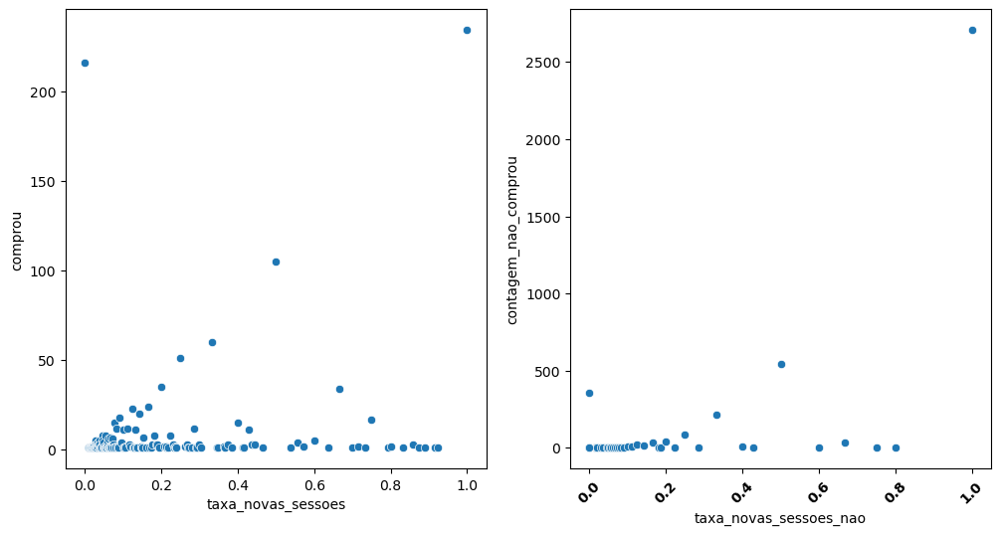

,taxa_novas_sessoes,comprou,taxa_novas_sessoes_nao,contagem_nao_comprou
0,0.000000,216,0.000000,359.0
1,0.010526,1,0.014085,1.0
2,0.011364,1,0.020000,1.0
3,0.011905,1,0.029412,1.0
4,0.013514,1,0.035714,1.0
5,0.014706,1,0.045455,1.0
6,0.015152,1,0.047619,2.0
7,0.015385,1,0.052632,1.0
8,0.016129,1,0.055556,1.0
9,0.016393,1,0.062500,1.0


In [41]:
df_taxa_novas_sessoes = analise_comportamento(df, 'taxa_novas_sessoes')
df_taxa_novas_sessoes.head(10)

Nessa variável, temos número muito próximos para usuários compradores e não compradores, possivelmente eliminaremos essa na modelagem.

## - Saídas

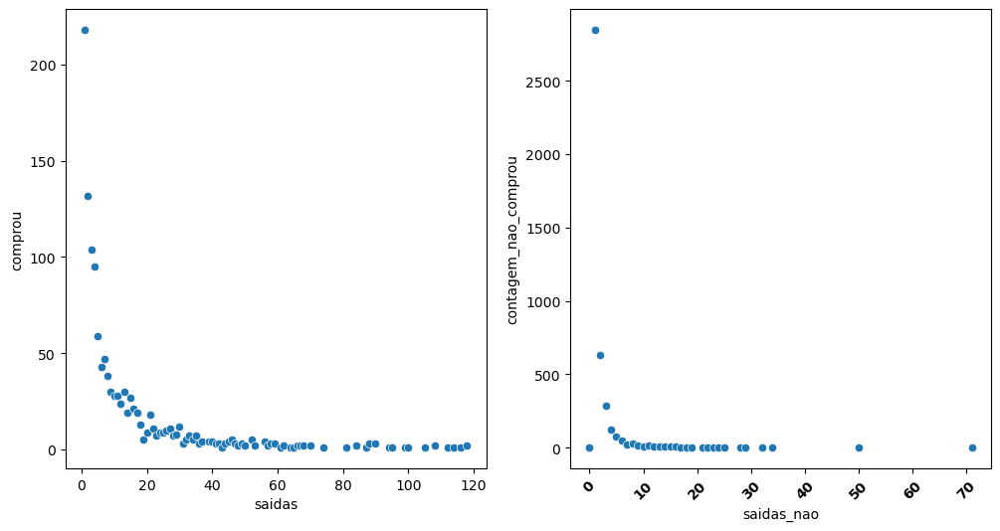

,saidas,comprou,saidas_nao,contagem_nao_comprou
0,1.0,218,1.0,2847.0
1,2.0,132,2.0,633.0
2,3.0,104,3.0,283.0
3,4.0,95,4.0,125.0
4,5.0,59,5.0,73.0
5,6.0,43,6.0,50.0
6,7.0,47,7.0,23.0
7,8.0,38,8.0,26.0
8,9.0,30,9.0,13.0
9,10.0,28,10.0,8.0


In [42]:
df_saidas = analise_comportamento(df, 'saidas')
df_saidas.head(10)

Número de vezes que os visitantes saíram do seu site a partir de uma página específica ou de um conjunto de páginas. Nota-se que os usuários que não estão prontos para comprar saem muitas vezes do site.

## - Rejeições

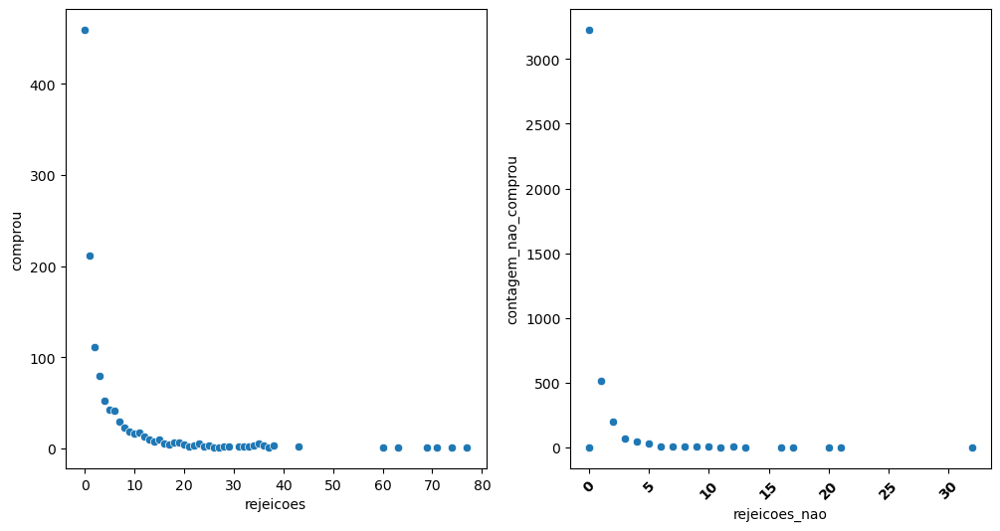

,rejeicoes,comprou,rejeicoes_nao,contagem_nao_comprou
0,0.0,459,0.0,3224.0
1,1.0,212,1.0,517.0
2,2.0,111,2.0,198.0
3,3.0,80,3.0,66.0
4,4.0,52,4.0,46.0
5,5.0,42,5.0,28.0
6,6.0,41,6.0,8.0
7,7.0,29,7.0,8.0
8,8.0,23,8.0,9.0
9,9.0,18,9.0,7.0


In [43]:
df_rejeicoes = analise_comportamento(df, 'rejeicoes')
df_rejeicoes.head(10)

Número de visitas de página única. Ocorre o mesmo que na variável saídas

## - Tempo médio na página

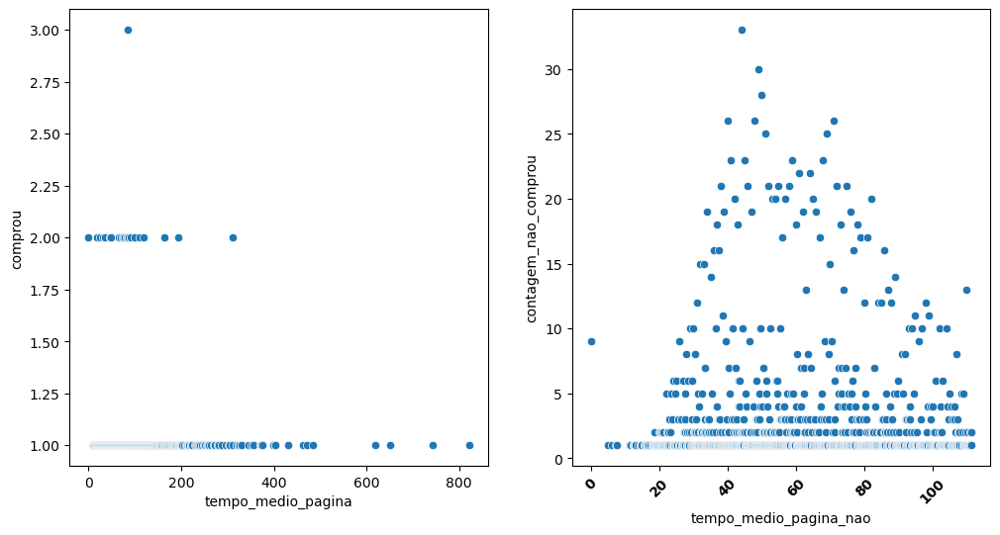

,tempo_medio_pagina,comprou,tempo_medio_pagina_nao,contagem_nao_comprou
0,0.000000,2,0.000000,9
1,8.571429,1,5.000000,1
2,9.400000,1,6.166667,1
3,11.000000,1,7.200000,1
4,11.100000,1,7.588235,1
5,11.142857,1,11.363636,1
6,11.750000,1,11.611111,1
7,11.800000,1,12.500000,1
8,12.350000,1,12.666667,1
9,12.750000,1,12.750000,1


In [44]:
df_tempo_medio_pagina = analise_comportamento(df, 'tempo_medio_pagina')
df_tempo_medio_pagina.head(10)

A média de tempo que os utilizadores passaram a ver uma página ou um conjunto de páginas. Os usuários que compram acabam por gastar menos tempo no site em média

## - Visualização de página única

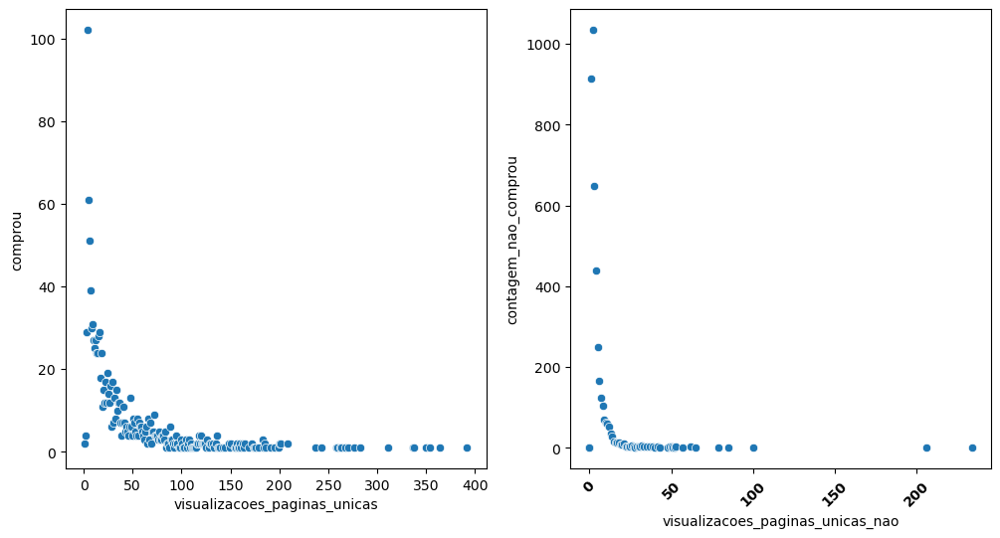

,visualizacoes_paginas_unicas,comprou,visualizacoes_paginas_unicas_nao,contagem_nao_comprou
0,1.0,2,1.0,914.0
1,2.0,4,2.0,1034.0
2,3.0,29,3.0,649.0
3,4.0,102,4.0,438.0
4,5.0,61,5.0,250.0
5,6.0,51,6.0,166.0
6,7.0,39,7.0,124.0
7,8.0,30,8.0,104.0
8,9.0,31,9.0,70.0
9,10.0,27,10.0,62.0


In [45]:
df_visualizacoes_paginas_unicas = analise_comportamento(df, 'visualizacoes_paginas_unicas')
df_visualizacoes_paginas_unicas.head(10)

É o número de sessões durante as quais a página especificada foi visualizada pelo menos uma vez. É contabilizada uma visualização de página única para cada combinação de URL de página + Título da página. Para este caso, temos um número bem maior para os usuários que não compraram

### Suposições antes da modelagem

Aqui faremos definiremos valores para as variáveis que indicam que o usuário tem o comportamento próximo de realizar uma compra. Posteriormente compararemos com os dados gerados pelos modelos. Serão três casos com os dados do site, demográfico e de comportamento para as análises de comportamento, cupom e item feitas anteriormente.

Consideraremos as seguintes variáveis: [valor, valor_frete, valor_total, item, quantidade, cupom, onde conheceu, cidade, estado,
sessoes, duração média de sessão, taxa de rejeição, check outs, visualizações de produto, pesquisas organicas, combinações de dimensões exclusivas, entradas, páginas por sessão, sessões por usuário, saídas, rejeições, tempo médio na página, visualizações de páginas únicas]

In [46]:
dados_comportamento = {'user_id' : 13, 'valor' : 130, 'valor_frete' : 9.90, 'valor_total' : 139.90, 'item' : 0, 'quantidade' : 1,
       'cupom' : 0, 'onde_conheceu' : 0, 'cidade' : 0, 'estado' : 7, 'sessoes' : 7,
       'duracao_media_sessao' : 130, 'taxa_rejeicao' : 10, 'check_outs' : 5,
       'visualizacoes_produto' : 4, 'pesquisas_organicas' : 2,
       'comb_dimensoes_exclusivas' : 3, 'entradas' : 4,
       'entradas_visualizacoes_pagina' : 7, 'pagina_por_sessoes' : 3,
       'sessoes_por_usuario' : 2, 'saidas' : 4, 'rejeicoes' : 4, 'tempo_medio_pagina' : 90,
       'visualizacoes_paginas_unicas' : 90, 'comprou' : 1}

dados_cupom = {'user_id' : 1159, 'valor' : 0, 'valor_frete' : 0, 'valor_total' : 0, 'item' : 0, 'quantidade' : 0,
       'cupom' : 0, 'onde_conheceu' : 12, 'cidade' : 22, 'estado' : 22, 'sessoes' : 22,
       'duracao_media_sessao' : 507, 'taxa_rejeicao' : 26, 'check_outs' : 4,
       'visualizacoes_produto' : 14, 'pesquisas_organicas' : 2,
       'comb_dimensoes_exclusivas' : 21, 'entradas' : 21,
       'entradas_visualizacoes_pagina' : 6, 'pagina_por_sessoes' : 8,
       'sessoes_por_usuario' : 2, 'saidas' : 8, 'rejeicoes' : 8, 'tempo_medio_pagina' : 98,
       'visualizacoes_paginas_unicas' : 61, 'comprou' : 1}
dados_item = {'user_id' : 237, 'valor' : 0, 'valor_frete' : 0, 'valor_total' : 0, 'item' : 0, 'quantidade' : 0,
       'cupom' : 0, 'onde_conheceu' : 19, 'cidade' : 0, 'estado' : 0, 'sessoes' : 15,
       'duracao_media_sessao' : 470, 'taxa_rejeicao' : 25, 'check_outs' : 5,
       'visualizacoes_produto' : 7, 'pesquisas_organicas' : 2,
       'comb_dimensoes_exclusivas' : 16, 'entradas' : 16,
       'entradas_visualizacoes_pagina' : 7, 'pagina_por_sessoes' : 7,
       'sessoes_por_usuario' : 2, 'saidas' : 16, 'rejeicoes' : 6, 'tempo_medio_pagina' : 96,
       'visualizacoes_paginas_unicas' : 50, 'comprou' : 1}

## Limpeza e tratamento dos dados 

In [47]:
df.isnull().sum()

user_id                             0
form_id                          5007
user_pass                        9380
id_pedido                           0
data_cadastro                       0
data_ultimo_pedido                  0
total_ultimo_pedido                 0
contagem_pedido                     0
total_por_pedido                    0
numero_pedido                    7707
status_pedido                    7707
data_pedido                      7707
valor                            7707
valor_frete                      7707
valor_total                      7707
variation_id                     7707
SKU                              8012
item                             7707
quantidade                       7707
cupom                            8875
onde_conheceu                    8321
cidade                           7708
estado                           7708
CEP                              7709
metodo_envio                     7710
sessoes                          4027
duracao_medi

In [48]:
df_analise = df.copy()

df_analise.drop(['form_id', 'user_pass', 'id_pedido', 'data_cadastro',
       'data_ultimo_pedido', 'total_ultimo_pedido', 'contagem_pedido',
       'total_por_pedido', 'numero_pedido', 'status_pedido', 'data_pedido',
       'variation_id', 'SKU', 'CEP', 'metodo_envio', 'produtos_no_carrinho', 
       'receita', 'transações', 'taxa_novas_sessoes',  'telas_por_sessao', 'visualizacoes_telas_unicas'], axis = 1, inplace = True)

df_analise['onde_conheceu'].fillna('-', inplace = True)
df_analise['cidade'].fillna('-', inplace = True)
df_analise['estado'].fillna('-', inplace = True)
df_analise['item'].fillna('-', inplace = True)
df_analise['cupom'].fillna('-', inplace = True)


colunas = ['valor', 'valor_frete', 'valor_total', 'valor_total', 'quantidade',
            'sessoes','duracao_media_sessao', 'taxa_rejeicao', 'check_outs',
            'visualizacoes_produto', 'pesquisas_organicas',
            'comb_dimensoes_exclusivas', 'entradas',
            'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
            'sessoes_por_usuario', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
            'visualizacoes_paginas_unicas']

for i in range(0, len(colunas)):
    df_analise[colunas[i]].fillna(0, inplace = True)
    
df_analise.isna().sum()

user_id                          0
valor                            0
valor_frete                      0
valor_total                      0
item                             0
quantidade                       0
cupom                            0
onde_conheceu                    0
cidade                           0
estado                           0
sessoes                          0
duracao_media_sessao             0
taxa_rejeicao                    0
check_outs                       0
visualizacoes_produto            0
pesquisas_organicas              0
comb_dimensoes_exclusivas        0
entradas                         0
entradas_visualizacoes_pagina    0
pagina_por_sessoes               0
sessoes_por_usuario              0
saidas                           0
rejeicoes                        0
tempo_medio_pagina               0
visualizacoes_paginas_unicas     0
comprou                          0
dtype: int64

<Axes: xlabel='comprou', ylabel='count'>

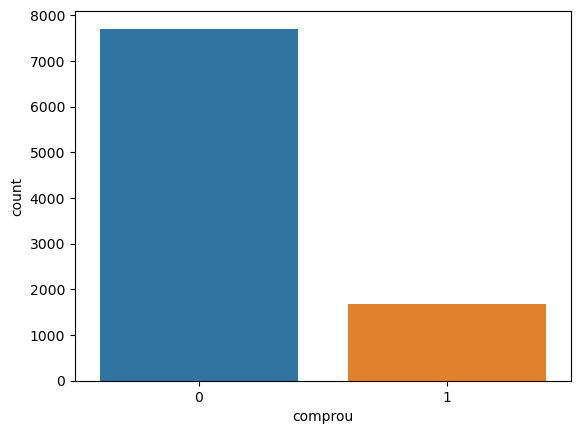

In [49]:
sns.countplot(x = 'comprou', data = df_analise)

Temos de balancear a variável objetivo com SMOTE, assim como tratar as variáveis categóricas e normalizar os dados.

### Transformando variáveis categóticas

A maioria dos modelos não lida bem com variáveis categóricas. Portanto, precisamos transformá-las a partir da criação de novas colunas. Cada uma delas se torna uma nova coluna e o valor na linha correspondente será 1, caso tenha a presença da característica. Do contrário, será 0. Esse processo é conhecido como codificação "one-hot". Para isso utilizaremos o método get_dummies() e  também pelo método LabelEncoder().

In [50]:
df_le = df_analise.copy()
df_le_salvo = df_le.copy()
le = LabelEncoder()                                            
le.fit(df_le['item'])
df_le['item']=le.transform(df_le['item'])    

le.fit(df_le['cupom'])
df_le['cupom'] = le.transform(df_le['cupom'])

le.fit(df_le['onde_conheceu'])
df_le['onde_conheceu'] = le.transform(df_le['onde_conheceu'])

le.fit(df_le['cidade'])
df_le['cidade']=le.transform(df_le['cidade'])

le.fit(df_le['estado'])
df_le['estado']=le.transform(df_le['estado'])

df_le.head()

,user_id,valor,valor_frete,valor_total,item,quantidade,cupom,onde_conheceu,cidade,estado,...,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas,comprou
0,287,219.9,28.16,248.06,6,1.0,1,0,151,14,...,3.0,3.0,0.157895,6.333333,1.5,3.0,1.0,17.875000,12.0,1
1,242,104.5,21.36,125.86,7,1.0,1,0,586,22,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,1
2,618,196.1,39.00,235.10,19,1.0,1,0,580,23,...,2.0,2.0,0.042553,23.500000,1.0,2.0,0.0,38.288889,32.0,1
3,634,154.9,27.00,181.90,6,1.0,1,0,179,20,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,1
4,693,67.9,21.80,89.70,5,1.0,1,0,452,22,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,1


In [51]:
dados_dummy = df_analise[['item', 'cupom', 'onde_conheceu', 'cidade', 'estado']]
dados_num = df_analise.drop(columns=['item', 'cupom', 'onde_conheceu', 'cidade', 'estado',
                                    'user_id', 'valor_total', 'quantidade', 'comb_dimensoes_exclusivas', 
                                     'rejeicoes', 'visualizacoes_produto', 'visualizacoes_paginas_unicas', 
                                     'saidas', 'sessoes_por_usuario','entradas', 'pesquisas_organicas'])
dados_dummy = pd.get_dummies(dados_dummy)
df_dum = pd.concat([dados_num, dados_dummy], axis=1)
df_dum.head()

,valor,valor_frete,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,entradas_visualizacoes_pagina,pagina_por_sessoes,tempo_medio_pagina,comprou,...,estado_PR,estado_RJ,estado_RN,estado_RO,estado_RR,estado_RS,estado_SC,estado_SE,estado_SP,estado_TO
0,219.9,28.16,3.0,95.333333,0.333333,0.0,0.157895,6.333333,17.875000,1,...,1,0,0,0,0,0,0,0,0,0
1,104.5,21.36,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,...,0,0,0,0,0,0,0,0,1,0
2,196.1,39.00,2.0,860.000000,0.000000,4.0,0.042553,23.500000,38.288889,1,...,0,0,0,0,0,0,0,0,0,1
3,154.9,27.00,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,...,0,0,0,0,0,0,1,0,0,0
4,67.9,21.80,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,...,0,0,0,0,0,0,0,0,1,0


### Balanceando dados e variável alvo

A classificação desequilibrada envolve o desenvolvimento de modelos preditivos em conjuntos de dados de classificação que apresentam um grave desequilíbrio de classes.

O desafio de trabalhar com conjuntos de dados desequilibrados é que a maioria das técnicas de aprendizado de máquina ignoram e, por sua vez, apresentam baixo desempenho na classe minoritária, embora normalmente o desempenho na classe minoritária seja o mais importante.

Uma abordagem para lidar com conjuntos de dados desequilibrados é sobreamostrar a classe minoritária. A abordagem mais simples envolve a duplicação de exemplos na classe minoritária, embora estes exemplos não adicionem nenhuma informação nova ao modelo. Em vez disso, novos exemplos podem ser sintetizados a partir dos exemplos existentes. Este é um tipo de aumento de dados para a classe minoritária e é conhecido como Técnica de Sobreamostragem Minoritária Sintética, ou SMOTE, para abreviar.

Da mesma maneira, lidaremos com a grande diferença de amplitude nas variáveis explicativas, com o StandardScaler. Ele implementa a TransformerAPI para calcular a média e o desvio padrão em um conjunto de treinamento, de modo a poder reaplicar posteriormente a mesma transformação no conjunto de teste.

<Axes: xlabel='comprou', ylabel='count'>

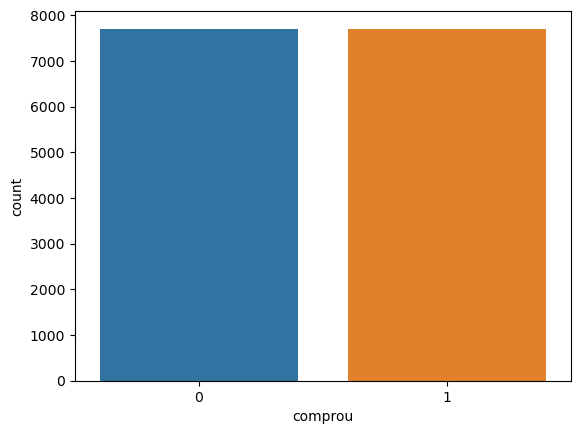

In [52]:
SEED = 1224

y = df_dum.comprou.copy()
X = df_dum.drop(['comprou'], axis = 1)

# norm = StandardScaler()
# X_norm = norm.fit_transform(X)

smt = SMOTE(random_state=SEED)
X, y = smt.fit_resample(X, y)


sns.countplot(x = 'comprou', data = pd.DataFrame(X,y).reset_index())

# Etapa 2: Classificação dos usuários referente a disposição para realizar a de compra utilizando da segmentação Kmeans

A clusterização ou agrupamento é uma técnica de aprendizado de máquina não-supervisionada. Na criação do modelo de clusterização não usamos a target, por isso é chamado de não-supervisionado. O algoritmo mais utilizado é o K-means. O K-means costuma ser mais aplicado em dados com poucas dimensões de dados numéricos e continuos para organizar os dados em grupos categóricos. O K-Means tem o objetivo de dividir as observações em k clusters baseado nas menores distâncias euclidianas.

A Curva de Cotovelo ou Método Elbow Curve é uma técnica usada para encontrar a quantidade ideal de clusters K. Este método testa a variância dos dados em relação ao número de clusters. O valor ideal de K é aquele que tem um menor Within Sum of Squares (WSS) e ao mesmo tempo o menor número de clusters

In [53]:
def calcular_wcss(data):
    wcss = []
    for k in range(1, 10):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X=data)
        data["clusters"] = kmeans.labels_
        wcss.append(kmeans.inertia_)
    return wcss

In [54]:
soma_quadrados = calcular_wcss(df_le)

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\clust

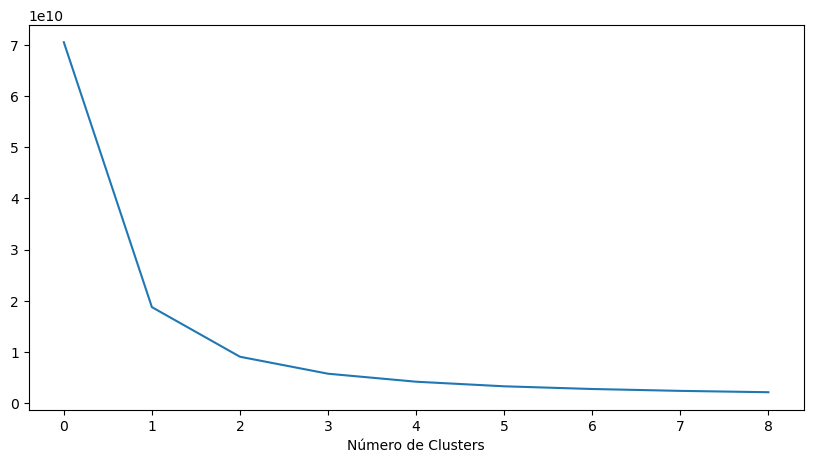

In [55]:
plt.figure(figsize=(10, 5))
plt.plot(soma_quadrados)
plt.xlabel("Número de Clusters")
plt.show()

In [56]:
def numero_otimo_clusters(wcss):
    x1, y1 = 2, wcss[0]
    x2, y2 = 20, wcss[len(wcss)-1]

    distancias = []
    for i in range(len(wcss)):
        x0 = i+2
        y0 = wcss[i]
        numerador = abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
        denominador = math.sqrt((y2 - y1)**2 + (x2 - x1)**2)
        distancias.append(numerador/denominador)
    
    return distancias.index(max(distancias)) + 2

# calculando a quantidade ótima de clusters
n = numero_otimo_clusters(soma_quadrados)
n

4

Com o número ideal de k, vamos seguir com o método pipeline e uma redução de dimensionalidade:
    
- O objetivo do pipeline é montar várias etapas que podem ser validadas cruzadas enquanto se definem parâmetros diferentes. O estimador de um degrau pode ser totalmente substituído definindo o parâmetro com seu nome para outro estimador, ou um transformador removido definindo-o como 'passagem' ou Nenhum. Assim, podemos aplicar sequencialmente uma lista de transformadores para pré-processar os dados e, se desejar, concluir a sequência com um preditor final para modelagem preditiva.

- A redução de dimensionalidade: trabalhar com um número menor de variáveis, com a menor perda de informação possível. Esse é o uso mais frequente da análise de componentes principais (PCA para principal component analysis): ela fornece novas variáveis chamadas de componentes principais, que são combinações lineares das 561 variáveis, e podem ser utilizadas em menor número de modo a minimizar a perda de informação.


In [57]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2, random_state=SEED))])

dados_pca = pca_pipeline.fit_transform(df_le)
projecao = pd.DataFrame(columns=['x', 'y'], data=dados_pca)

kmeans_pca = KMeans(n_clusters=4, random_state=SEED).fit(projecao)

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Uma das métricas comumente usadas é o índice de silhouete. Essa medida calcula o quão bem cada objeto se encaixa no seu cluster atribuído, comparando a distância média intra-cluster com a distância média com os objetos de outros clusters. Valores próximos de 1 indicam um bom ajuste, enquanto valores negativos ou próximos de 0 indicam que o objeto pode pertencer a outro cluster.

In [58]:
df_le['cluster_pca'] = kmeans_pca.predict(projecao)
projecao['cluster_pca'] = kmeans_pca.predict(projecao)

print('Taxa de variância {}'.format(pca_pipeline[1].explained_variance_ratio_.sum()))
print('Variância {}'.format(pca_pipeline[1].explained_variance_.sum()))

values = StandardScaler().fit_transform(df_le.values)
y_pred = kmeans_pca.fit_predict(values)
labels = kmeans_pca.labels_
silhouette = metrics.silhouette_score(values, labels, metric='euclidean')

print('Silhouete {}'.format(silhouette))

Taxa de variância 0.5750757760695424
Variância 15.528701465760985


C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouete 0.3354811390330292


In [59]:
fig = px.scatter(projecao, x='x', y='y', color='cluster_pca', hover_data=['x', 'y'])
fig.show()

## Ordenando clusters

Para uma melhor visualização dos resultados ordenaremos os clusters

In [60]:
def media_clusters(base, grupo):
    descricao = base.groupby(grupo)['sessoes','duracao_media_sessao', 'check_outs',
           'comb_dimensoes_exclusivas', 'sessoes_por_usuario',
           'tempo_medio_pagina']

    n_clientes = descricao.size()
    descricao = descricao.mean()
    descricao['n_clientes'] = n_clientes
    return descricao

media_clusters(df_le, 'cluster_pca')

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\372001112.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,sessoes,duracao_media_sessao,check_outs,comb_dimensoes_exclusivas,sessoes_por_usuario,tempo_medio_pagina,n_clientes
cluster_pca,,,,,,,
0,0.935777,169.224287,0.261050,0.940198,0.875503,50.336362,7692
1,21.552486,291.253165,5.939227,21.809392,10.242101,73.466150,362
2,2.442766,348.887044,1.494436,2.474563,1.463007,61.389457,1258
3,70.088235,242.560736,7.411765,70.985294,28.066439,81.299631,68


In [61]:
alterar = {0:0, 1:1, 2:3, 3:2}
df_le['cluster'] = df_le['cluster_pca'].map(alterar)
df_le.drop('cluster_pca', axis = 1)

descricao = media_clusters(df_le, 'cluster')
descricao.sort_values('n_clientes', ascending = False)

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\372001112.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,sessoes,duracao_media_sessao,check_outs,comb_dimensoes_exclusivas,sessoes_por_usuario,tempo_medio_pagina,n_clientes
cluster,,,,,,,
0,0.935777,169.224287,0.261050,0.940198,0.875503,50.336362,7692
3,2.442766,348.887044,1.494436,2.474563,1.463007,61.389457,1258
1,21.552486,291.253165,5.939227,21.809392,10.242101,73.466150,362
2,70.088235,242.560736,7.411765,70.985294,28.066439,81.299631,68


In [62]:
fig = px.funnel(descricao, x='n_clientes')
fig.show()

Conseguimos classificar os assinantes pelo comportamento. Isso nos gerou o funil de vendas da empresa, um modelo estratégico separado por estágios, estruturando de forma visual toda a jornada de compra de um cliente em potencial. 

Esse tipo de funil é uma clássica representação para os setores de vendas e marketing e  nos indica quais leads estão mais preparados e propensos a realizarem uma compra

## Etapa 3: Vendas cruzadas para quem comprou: ao analisar as compras conjuntas anteriores, podemos identificar quais produtos podem ser oferecidos para determinadas compras.

Seguindo a vida do assinante dentro do clube, podemos gerar campanhas de marketing e vendas indicando novos produtos através de vendas cruzadas. 

A venda cruzada é uma das técnicas de vendas utilizadas para aumentar o valor de uma compra ou da assinatura, ou seja, o ticket médio. Em suma do que é venda cruzada, pode-se dizer que é uma prática comercial que mostra ao cliente produtos adicionais e complementares com intenção de elevar o valor por pedido.

Analisaremos as afinidades de cada produto e quantos clientes os compraram juntos. Quanto maior o número de clientes comprando os mesmos itens, maior a pontuação. Então, a recomendação de produto será aquela cujo item 2 tenha a maior pontuação em relação ao item 1.

In [63]:
#Obter a lista de itens únicos
item = list(set(pedidos_reco["Item Name"].tolist()))

#Obter a contagem de usuários
contagem_usuario = len(set(pedidos_reco["id_pedido"].tolist()))

#Criar um data frame vazio para armazenar a pontuação de afinidade por itens.
afinidade = pd.DataFrame(columns=('item1', 'item2', 'pontuacao'))
linha = 0

#Para cada item da lista, comparar com outros itens.
for ind1 in range(len(item)):
    
    #Obter a lista de usuários que compraram o item 1.
    item1_usuarios = pedidos_reco[pedidos_reco["Item Name"] == item[ind1]]["id_pedido"].tolist()
    
    #Obter os itens que não são o item 1 ou que não foram analisados ainda.
    for ind2 in range(ind1, len(item)):    
        if ( ind1 == ind2):
            continue
        #Obter a lista de usuários que comrparam o item 2
        item2_usuarios = pedidos_reco[pedidos_reco["Item Name"] == item[ind2]]["id_pedido"].tolist()
        
        #Encontrar pontuação. Encontrar a lista de usuários em comum e dividi-la pelo total de usuários.
        usuarios_emcomum = len(set(item1_usuarios).intersection(set(item2_usuarios)))
        pontuacao = usuarios_emcomum / contagem_usuario

        #Adicionar pontuação para o item 1, item 2
        afinidade.loc[linha] = [item[ind1], item[ind2], pontuacao]
        linha +=1
        
        #Adicionar pontuação para o item 1, item 2. A mesma pontuação se aplica independente da sequência.
        afinidade.loc[linha] = [item[ind2], item [ind1], pontuacao]
        linha +=1
        
#Checar resultado final
afinidade.sort_values('pontuacao', ascending = False)

,item1,item2,pontuacao
10828,BOX PERSONALIZADO,ASSINATURA MENSAL,0.105851
10829,ASSINATURA MENSAL,BOX PERSONALIZADO,0.105851
4925,ASSINATURA MENSAL,UMMABOX 20 SESSÕES COM PREMIUM,0.081383
4924,UMMABOX 20 SESSÕES COM PREMIUM,ASSINATURA MENSAL,0.081383
11579,UMMABOX 28 SESSÕES,ASSINATURA MENSAL,0.047872
...,...,...,...
4607,Triton Hoover - Filtro de Rosh - Bronze,Tapete Zord Heróis 20 x 20 cm - Mulher Maravilha,0.000000
4608,Tapete Zord Heróis 20 x 20 cm - Mulher Maravilha,Triton Hoover - Filtro de Rosh - Roxo,0.000000
4609,Triton Hoover - Filtro de Rosh - Roxo,Tapete Zord Heróis 20 x 20 cm - Mulher Maravilha,0.000000
4610,Tapete Zord Heróis 20 x 20 cm - Mulher Maravilha,Box Avulso Esquenta Black Friday - 3,0.000000


In [64]:
buscar_item = 'BOX PREMIUM'
itens = ['ASSINATURA MENSAL', 'BOX PERSONALIZADO', 'UMMABOX 28 SESSÕES']
procurar = afinidade.query('item2 !={}'.format(itens))

reco = procurar[procurar.item1 == buscar_item][["item2","pontuacao"]].sort_values("pontuacao", ascending = False)
        
print("Recomendações para o item\n", reco)

Recomendações para o item
                                                 item2  pontuacao
5112                                    BOX ECONÔMICO   0.001596
5090                               Suporte Computador   0.001064
5032                           BOX DE NARGUILE AVULSO   0.000532
5120                          Suporte Videogame - PS4   0.000532
47                           Piteira Higiênica Bigode   0.000000
...                                               ...        ...
5036  Rosh de Narguile Pro Hookah - Old School Branco   0.000000
5034                            Furador Seven - Preto   0.000000
5030                         Tangiers Noir Cocoa 250g   0.000000
5028         Essência Oro Smoke Pasta 50g - Coca Cola   0.000000
5198           Triton Hoover - Filtro de Rosh - Prata   0.000000

[113 rows x 2 columns]


Como temos poucos pedidos em relação ao número de pedidos de assinatura, o grau de recomendação é pequeno. Porém, já temos indicativos de compras realizadas juntas e podemos aplicar o modelo para obter mais exemplos.

## Etapa 4: Previsão do LTV e retenção: faremos uma segmenteção Kmeans, utilizando a técnica RFV adapatada para o modelo de assinatura e então faremos um modelo para a previsão da do valor da vida útil (LTV) e a quantidade de meses como assinante dos usuários.

Vamos classificar os assinantes pela Técnica RFV (frequência, recência e receita/valor) adapatada para o caso de assinaturas e prever o ltv médio para cada grupo. 

Usaremos o banco de dados do site com K-means para identificar a frequência, recência e receita dos consumidores (adaptados ao modelo de assinatura) e agrupá-los em categorias de compras. Assim podemos fazer campanhas de marketing específicas, além de criar programas de recompensas para os clientes que mais consomem.

> Precisamos definir agora as três variáveis que utilizaremos para segmentação: **recência**, **frequência** e **receita**. Em inglês, é chamado de método RFM. Este é um método utilizado para analisar o comportamento do cliente e definir segmentos de mercado. :

- Recência: quão recentemente um cliente fez uma compra CS. É um importante preditor, pois um cliente que comprou há pouco tempo tem mais chance de voltar a comprar do que aquele que comprou há muito tempo, além de apresentar uma probabilidade maior de responder a promoções.
- Frequência: com que frequência um cliente faz uma compra.  Se um cliente compra frequentemente, espera-se que ele volte a comprar. Seria a quantidade de pedidos entre renovações e cs somados
- Receita: quanto dinheiro um cliente gasta em compras. Aqueles clientes que gastaram muito têm mais valor para a organização em comparação com aqueles que gastaram menos

In [65]:
pedidos_reco.columns = ['user_id', 'id_pedido', 'numero_pedido', 'status', 'data_pedido',
       'valor', 'valor_frete', 'valor_total', 'Variation Id', 'SKU', 'item', 'quantidade',
       'custo_item', 'cupom', 'onde_conheceu', 'cidade', 'estado','CEP']

In [66]:
colunas_reco = [ 'Variation Id', 'SKU', 'item', 'cupom', 'onde_conheceu', 'cidade', 'estado', 'CEP']

for i in range(0, len(colunas_reco)):
    pedidos_reco[colunas_reco[i]].fillna('-', inplace = True)
    
pedidos_reco['custo_item'].fillna(0, inplace = True)
pedidos_reco['quantidade'].fillna(0, inplace = True)
pedidos_reco['user_id'].fillna(0, inplace = True)

pedidos_reco.isna().sum()

user_id          0
id_pedido        0
numero_pedido    0
status           0
data_pedido      0
valor            0
valor_frete      0
valor_total      0
Variation Id     0
SKU              0
item             0
quantidade       0
custo_item       0
cupom            0
onde_conheceu    0
cidade           0
estado           0
CEP              0
dtype: int64

#### **Recência adaptada** 

In [67]:
#seleciona o ponto de observação como a data máxima de compra em nosso df
df_cluster = pedidos_reco.groupby('id_pedido').data_pedido.max().reset_index()
df_cluster['recencia'] = (df_cluster['data_pedido'].max() - df_cluster['data_pedido']).dt.days

df_cluster.head()

,id_pedido,data_pedido,recencia
0,1,2022-08-13 09:38:38,7
1,2,2022-07-26 09:30:00,25
2,3,2022-08-10 10:35:51,10
3,4,2022-08-20 09:16:09,0
4,5,2022-08-13 14:37:00,7


C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\3388545909.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='recencia', ylabel='Density'>

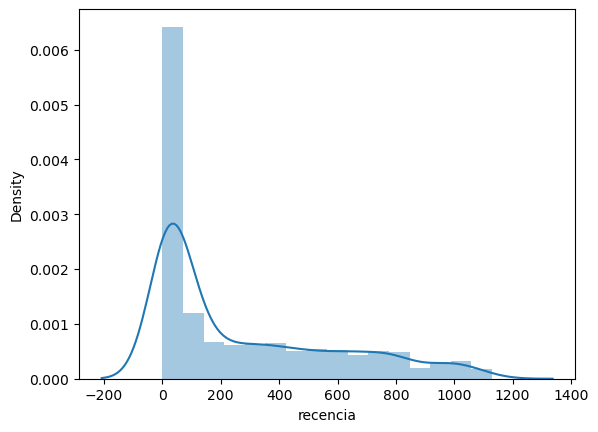

In [68]:
sns.distplot(df_cluster['recencia'])

#### Selecionando valor de k para kmeans pela regra do cotovelo, como feito anteriormente

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\1570636865.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto'

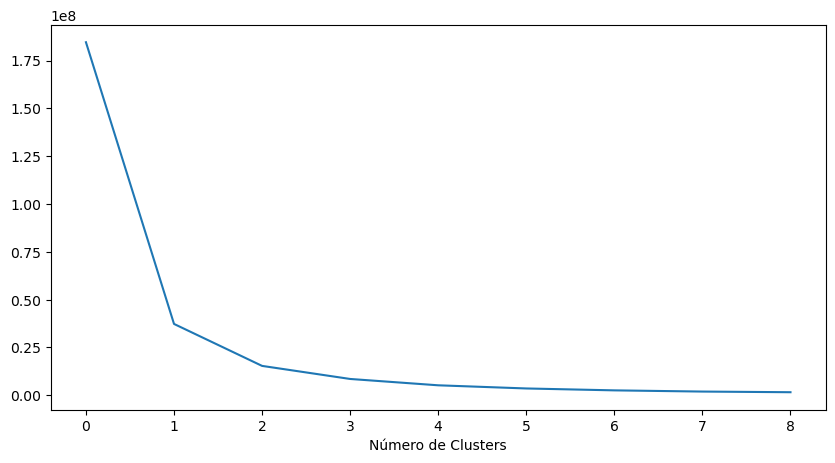

In [69]:
soma_quadrados = calcular_wcss(df_cluster[['recencia']])
plt.figure(figsize=(10, 5))
plt.plot(soma_quadrados)
plt.xlabel("Número de Clusters")
plt.show()

Para determinar o número ótimo de clusters, calculamos as distâncias entre os pontos e usamos a menor delas

In [70]:
# calculando a quantidade ótima de clusters
n = numero_otimo_clusters(soma_quadrados)
n

4

In [71]:
# rodando o kmeans para nossa quantidade ótima de clusters
kmeans_rec = KMeans(n_clusters=4)
df_cluster['recencia_cluster'] = kmeans_rec.fit_predict(df_cluster[['recencia']])
df_cluster.columns = ['id','data_pedido', 'recencia', 'recencia_cluster']
df_cluster

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.



,id,data_pedido,recencia,recencia_cluster
0,1,2022-08-13 09:38:38,7,0
1,2,2022-07-26 09:30:00,25,0
2,3,2022-08-10 10:35:51,10,0
3,4,2022-08-20 09:16:09,0,0
4,5,2022-08-13 14:37:00,7,0
...,...,...,...,...
1875,1876,2022-08-19 11:31:19,1,0
1876,1877,2022-08-11 19:08:06,8,0
1877,1878,2022-07-28 18:58:40,22,0
1878,1879,2022-08-17 19:38:06,2,0


In [72]:
#função para ordenar o número de clusters 
def ordenar_cluster(cluster_nome, target_nome,df,ascending):
    novo_nome = 'novo' + cluster_nome
    agrupado_por_cluster = df.groupby(cluster_nome)[target_nome].mean().reset_index()
    agrupado_por_cluster_ordenado = agrupado_por_cluster.sort_values(by=target_nome,
                                                                     ascending=ascending).reset_index(drop=True)
    agrupado_por_cluster_ordenado['index'] = agrupado_por_cluster_ordenado.index
    juntando_cluster = pd.merge(df,agrupado_por_cluster_ordenado[[cluster_nome,'index']], on=cluster_nome)
    removendo_dados = juntando_cluster.drop([cluster_nome],axis=1)
    df_final = removendo_dados.rename(columns={"index":cluster_nome})
    return df_final

In [73]:
df_cluster = ordenar_cluster('recencia_cluster', 'recencia',df_cluster,False)
df_cluster.groupby('recencia_cluster')['recencia'].describe()

,count,mean,std,min,25%,50%,75%,max
recencia_cluster,,,,,,,,
0,155.0,963.096774,85.883020,815.0,890.00,979.0,1019.00,1129.0
1,291.0,664.848797,89.578579,511.0,590.50,659.0,751.50,810.0
2,346.0,352.312139,86.585072,200.0,277.25,351.0,420.25,507.0
3,1088.0,47.370404,47.623135,0.0,12.00,35.0,62.00,199.0


Temos os dados relativos a recência da técnica RFV

### **5.2. Frequência adaptada** 

In [74]:
# cria um df com a quantidade de ordens para cada cliente
df_frequencia = pedidos_reco.groupby('id_pedido').data_pedido.count().reset_index()
df_frequencia.columns = ['id','frequencia']

# adiciona esses dados em nosso df principal
df_cluster = pd.merge(df_cluster, df_frequencia, on='id')
df_cluster.head()

,id,data_pedido,recencia,recencia_cluster,frequencia
0,1,2022-08-13 09:38:38,7,3,2
1,2,2022-07-26 09:30:00,25,3,7
2,3,2022-08-10 10:35:51,10,3,2
3,4,2022-08-20 09:16:09,0,3,7
4,5,2022-08-13 14:37:00,7,3,2


In [75]:
# rodando o kmeans para nossa quantidade ótima de clusters
df_frequencia = df_cluster[['frequencia']]

kmeans_freq = KMeans(n_clusters=4)
df_cluster['frequencia_cluster'] = kmeans_freq.fit_predict(df_frequencia)

df_cluster.groupby('frequencia_cluster')['frequencia'].describe()

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.



,count,mean,std,min,25%,50%,75%,max
frequencia_cluster,,,,,,,,
0,361.0,5.623269,1.637040,4.0,4.0,5.0,7.0,9.0
1,218.0,13.133028,2.372211,10.0,11.0,13.0,15.0,18.0
2,1234.0,1.698541,0.771479,1.0,1.0,2.0,2.0,3.0
3,67.0,24.134328,4.562348,19.0,21.0,23.0,25.0,38.0


In [76]:
df_cluster = ordenar_cluster('frequencia_cluster', 'frequencia',df_cluster,True)
df_cluster.groupby('frequencia_cluster')['frequencia'].describe()

,count,mean,std,min,25%,50%,75%,max
frequencia_cluster,,,,,,,,
0,1234.0,1.698541,0.771479,1.0,1.0,2.0,2.0,3.0
1,361.0,5.623269,1.637040,4.0,4.0,5.0,7.0,9.0
2,218.0,13.133028,2.372211,10.0,11.0,13.0,15.0,18.0
3,67.0,24.134328,4.562348,19.0,21.0,23.0,25.0,38.0


Temos os dados relativos a frequência da técnica RFV

### **5.3. Receita adaptada** 

In [77]:
#calcula a receita para cada cliente
df_receita = pedidos_reco.groupby('id_pedido').valor_total.sum().reset_index()
df_receita.columns = ['id', 'receita']

#junta com o df principal
df_cluster = pd.merge(df_cluster, df_receita, on='id')
df_cluster.head()

,id,data_pedido,recencia,recencia_cluster,frequencia,frequencia_cluster,receita
0,1,2022-08-13 09:38:38,7,3,2,0,326.72
1,3,2022-08-10 10:35:51,10,3,2,0,299.31
2,5,2022-08-13 14:37:00,7,3,2,0,324.53
3,7,2022-08-10 21:25:16,9,3,3,0,405.66
4,8,2022-08-03 09:22:11,17,3,2,0,304.28


In [78]:
# rodando o kmeans para nossa quantidade ótima de clusters
df_pagamento = df_cluster[['receita']]
kmeans_receita = KMeans(n_clusters=4)
df_cluster['receita_cluster'] = kmeans_receita.fit_predict(df_pagamento)
df_cluster.groupby('receita_cluster')['receita'].describe()

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.



,count,mean,std,min,25%,50%,75%,max
receita_cluster,,,,,,,,
0,148.0,2777.781486,540.165839,2075.26,2328.0500,2654.415,3143.905,4148.24
1,1411.0,303.412495,196.556106,0.00,145.1650,271.800,434.925,832.60
2,295.0,1358.009017,366.782901,833.42,1043.4000,1293.300,1668.315,2062.86
3,26.0,5539.068077,1534.973056,4250.40,4630.5875,5039.440,5455.700,9951.28


In [79]:
df_cluster = ordenar_cluster('receita_cluster', 'receita',df_cluster,True)
df_cluster.groupby('receita_cluster')['receita'].describe()

,count,mean,std,min,25%,50%,75%,max
receita_cluster,,,,,,,,
0,1411.0,303.412495,196.556106,0.00,145.1650,271.800,434.925,832.60
1,295.0,1358.009017,366.782901,833.42,1043.4000,1293.300,1668.315,2062.86
2,148.0,2777.781486,540.165839,2075.26,2328.0500,2654.415,3143.905,4148.24
3,26.0,5539.068077,1534.973056,4250.40,4630.5875,5039.440,5455.700,9951.28


In [80]:
df_final = ordenar_cluster('frequencia_cluster', 'receita_cluster',df_cluster,False)
df_final.head()

,id,data_pedido,recencia,recencia_cluster,frequencia,receita,receita_cluster,frequencia_cluster
0,1,2022-08-13 09:38:38,7,3,2,326.72,0,3
1,3,2022-08-10 10:35:51,10,3,2,299.31,0,3
2,5,2022-08-13 14:37:00,7,3,2,324.53,0,3
3,7,2022-08-10 21:25:16,9,3,3,405.66,0,3
4,8,2022-08-03 09:22:11,17,3,2,304.28,0,3


Temos os dados relativos a receita da técnica RFV

## 6\. Pontuação do assinante

Calcularemos a pontuação geral do cliente baseado nesses clusters e também definiremos as classes dos assinantes

In [81]:
df_final['pontuacao'] = df_cluster['recencia_cluster'] + df_cluster['frequencia_cluster'] + df_cluster['receita_cluster']
df_final.groupby('pontuacao')['recencia','frequencia','receita'].mean()

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\583810369.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,recencia,frequencia,receita
pontuacao,,,
0,969.426357,1.434109,212.414109
1,676.904167,1.683333,234.495542
2,363.146067,1.947566,292.069251
3,90.720930,2.132267,322.926788
4,129.189349,5.366864,860.574497
5,37.528986,8.202899,1356.915000
6,104.816514,19.660550,3279.664312
7,218.071429,13.309524,2328.342024
8,110.916667,12.833333,1692.159444


In [82]:
df_final['segmento'] = 'Em risco'
df_final.loc[df_final['pontuacao']>=2,'segmento'] = 'Atenção' 
df_final.loc[df_final['pontuacao']>=4,'segmento'] = 'Neutro' 
df_final.loc[df_final['pontuacao']>=6,'segmento'] = 'Promissores' 
df_final.loc[df_final['pontuacao']>=8,'segmento'] = 'Ideal' 
df_final

,id,data_pedido,recencia,recencia_cluster,frequencia,receita,receita_cluster,frequencia_cluster,pontuacao,segmento
0,1,2022-08-13 09:38:38,7,3,2,326.72,0,3,3,Atenção
1,3,2022-08-10 10:35:51,10,3,2,299.31,0,3,3,Atenção
2,5,2022-08-13 14:37:00,7,3,2,324.53,0,3,3,Atenção
3,7,2022-08-10 21:25:16,9,3,3,405.66,0,3,3,Atenção
4,8,2022-08-03 09:22:11,17,3,2,304.28,0,3,3,Atenção
...,...,...,...,...,...,...,...,...,...,...
1875,1499,2021-05-03 09:50:51,474,2,12,2288.88,2,1,8,Ideal
1876,627,2021-03-07 10:59:45,531,1,14,4379.20,3,1,6,Promissores
1877,571,2021-04-05 10:01:25,502,2,18,5035.69,3,1,7,Promissores
1878,953,2021-06-24 09:40:29,422,2,16,4620.80,3,1,7,Promissores


In [83]:
def plot_segmento(x,y,data):
    sns.set(palette='muted', color_codes=True, style='whitegrid')
    fig, axs = plt.subplots(1, 1, figsize=(12, 8))
    sns.despine(left=True)
    sns.scatterplot(x=x, y=y, hue='segmento', data=data, size='segmento', sizes=(50,150), 
                    size_order=['Ideal','Promissores','Neutro','Atenção','Em risco'])
    axs.set_title('Segmento de Cliente')
    plt.show()

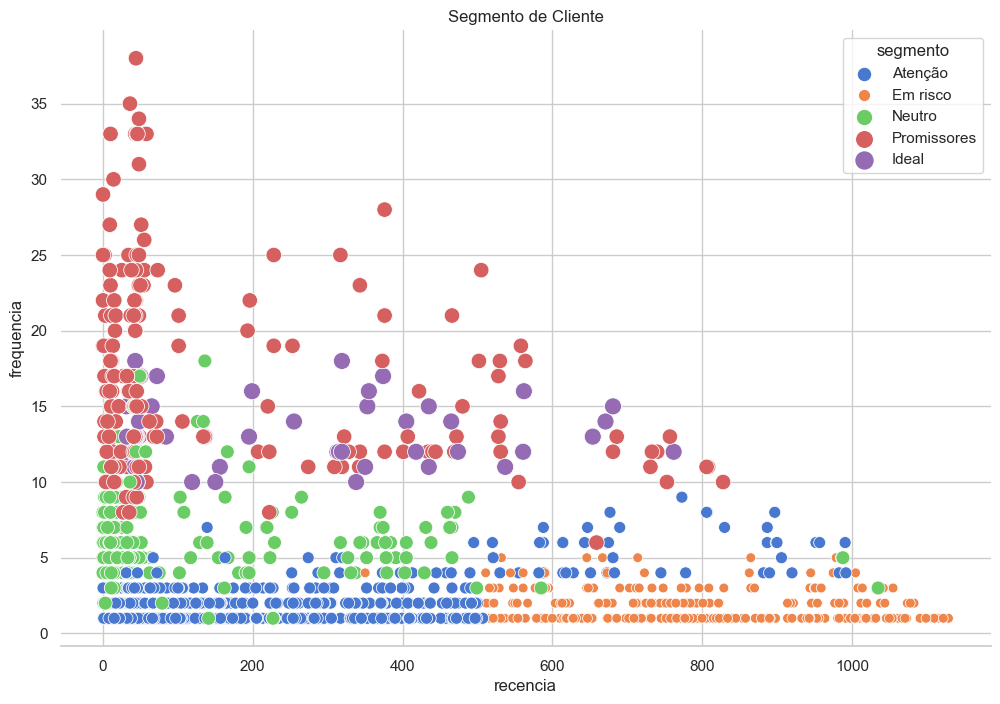

In [84]:
plot_segmento('recencia','frequencia',df_final)

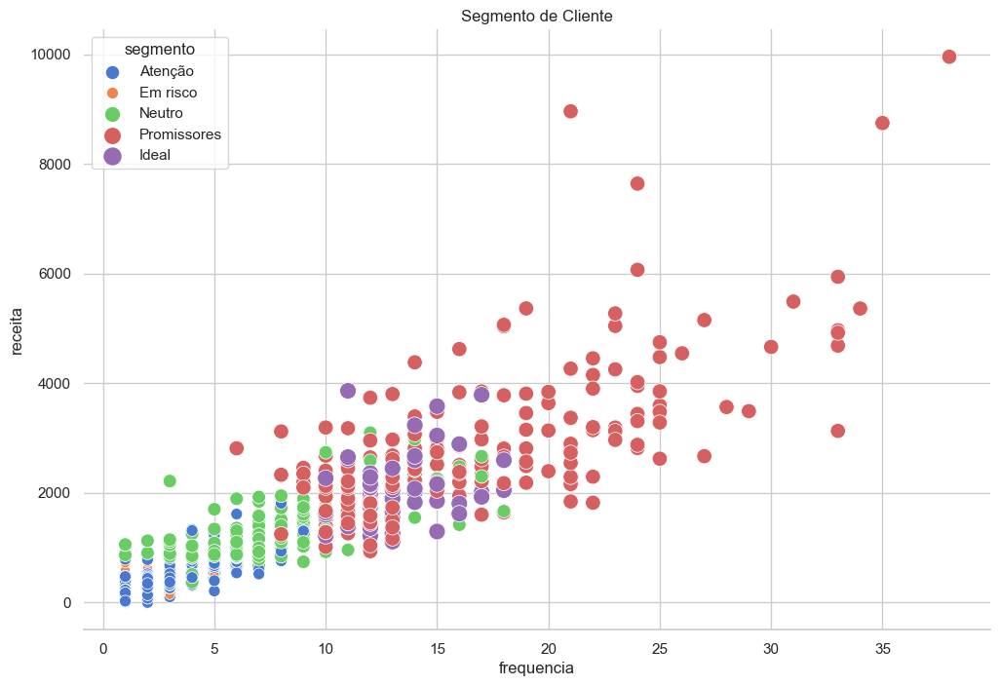

In [85]:
plot_segmento('frequencia','receita',df_final)

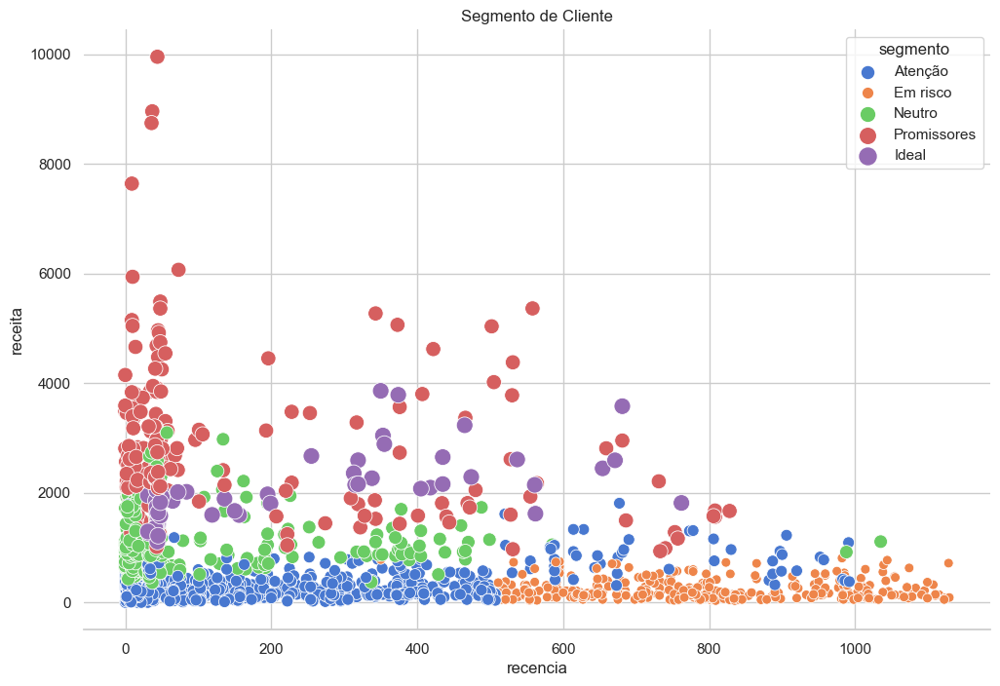

In [86]:
plot_segmento('recencia','receita',df_final)

Podemos ver que quanto menor a recência, maior a receita e maior a frequência, mais próximo do grupo de clientes ideal e promissores. 

Com essa segmentação de clientes podemos explorar cadas segmento com uma abordagem diferente e ver qual tem melhor resultado. Podemos prever o ltv e também o churn

## Agora vamos prever o ltv

LTV (Lifetime Value) é uma estimativa da receita média que um cliente irá gerar ao longo de sua vida como cliente. É uma métrica valiosa para empresas com venda recorrente ou com repetição.

In [87]:
df_ltv = df_final[['recencia', 'frequencia', 'receita']]
df_ltv

,recencia,frequencia,receita
0,7,2,326.72
1,10,2,299.31
2,7,2,324.53
3,9,3,405.66
4,17,2,304.28
...,...,...,...
1875,474,12,2288.88
1876,531,14,4379.20
1877,502,18,5035.69
1878,422,16,4620.80


### - Regressão Linear

Ao realizar o treinamento de um modelo, os dados são divididos em um conjunto de treinamento e um conjunto de teste. O conjunto de treinamento é usado para ensinar o modelo, enquanto o conjunto de teste é usado para avaliar o desempenho e a precisão do modelo. 

Caso usássemos a totalidade de dados que temos, o modelo realizaria a previsão normalmente. Porém, ao inserirmos dados novos, não teríamos como saber qual o real desempenho dele. Ele poderia aprender a relação existente entre todos os dados do banco e posteriormente teria um problema de Overfitting (ocorre quando o modelo se adaptou muito bem aos dados que foi treinado, mas não generaliza bem para novos dados, seria como se ele tivesse decorado mas não aprendido de fato).


In [88]:
X_ltv = df_ltv[['recencia', 'frequencia']].copy()
y_ltv = df_ltv.receita

X_treino, X_teste, y_treino, y_teste = train_test_split(X_ltv, y_ltv, test_size=0.2, random_state=SEED)

Regressão linear é uma equação para se estimar a condicional (valor esperado) de uma variável y, dados os valores de algumas outras variáveis x. A regressão, em geral, tem como objetivo tratar de um valor que não se consegue estimar inicialmente.

In [89]:
lr = LinearRegression()
reg = lr.fit(X_treino, y_treino)
print(f'Coeficientes {reg.coef_}')
print(f'Intercepto {reg.intercept_}')

reg_pred = reg.predict(X_teste)
r2_score(y_teste, reg_pred)*100

Coeficientes [-3.76905078e-03  1.62146535e+02]
Intercepto -7.855075658310852


88.06528651451245

### - Árvores de decisão

Uma árvore de decisão é um algoritmo de aprendizado de máquina supervisionado que é utilizado para classificação e para regressão.

Assim como um fluxograma, a árvore de decisão estabelece nós (decision nodes) que se relacionam entre si por uma hierarquia. Existe o nó-raiz (root node), que é o mais importante, e os nós-folha (leaf nodes), que são os resultados finais. No contexto de machine learning, o raiz é um dos atributos da base de dados e o nó-folha é a classe ou o valor que será gerado como resposta.

In [90]:
dtr = DecisionTreeRegressor()
reg_dtr = dtr.fit(X_treino, y_treino)
print(f'Importâncoas {reg_dtr.feature_importances_}')

reg_dtr_pred = reg_dtr.predict(X_teste)
r2_score(y_teste, reg_dtr_pred)*100

Importâncoas [0.10959425 0.89040575]


77.04071206175924

Usaresmo o grid_search para otimizar os parâmetros da árvore de decisão

GridSearchCV aplica uma busca exaustiva sobre valores de parâmetros especificados para um estimador. Ele implementa um método de “ajuste” e um método de “pontuação”. Também implementa “score_samples”, “predict”, “predict_proba”, “decision_function”, “transform” e “inverse_transform” se forem implementados no estimador utilizado.

Os parâmetros do estimador usados para aplicar esses métodos são otimizados por pesquisa de grade com validação cruzada em uma grade de parâmetros.

In [91]:
grid_parameters_dt = {'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'], 'max_depth' : [6,8,10], 
 'min_samples_split':[14,16,20], 'min_samples_leaf': [4,6,8], 'ccp_alpha':[0, 5.09274489e-05, 1.62755875e-05]}

grid_reg_dtr = GridSearchCV(estimator = reg_dtr, param_grid=grid_parameters_dt, cv=3)
grid_reg_dtr.fit(X_treino, y_treino)
grid_reg_dtr.best_params_

{'ccp_alpha': 0,
 'criterion': 'poisson',
 'max_depth': 6,
 'min_samples_leaf': 8,
 'min_samples_split': 20}

In [92]:
dtr = DecisionTreeRegressor(criterion= 'absolute_error', max_depth = 6, min_samples_leaf = 6, min_samples_split = 16)
reg_dtr = dtr.fit(X_treino, y_treino)
print(f'Importâncias {reg_dtr.feature_importances_}')
#print(f'Intercepto {reg_dtr.intercept_}')

reg_dtr_pred = reg_dtr.predict(X_teste)
r2_score(y_teste, reg_dtr_pred)*100

Importâncias [0.02778258 0.97221742]


84.48389411042182

Regressão linear apresentou um melhor resultado. Agora podemos aplicar esse modelo nos novos clientes para prever qual será o ltv

In [93]:
reg_pred = reg.predict(df_ltv[['recencia', 'frequencia']])
df_ltv['receita_prevista'] = reg_pred
df_ltv['meses_assinatura_previstos'] = round(df_ltv['receita_prevista']/178.90)
df_ltv

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\3550665672.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\arsnf\AppData\Local\Temp\ipykernel_9336\3550665672.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,recencia,frequencia,receita,receita_prevista,meses_assinatura_previstos
0,7,2,326.72,316.411611,2.0
1,10,2,299.31,316.400304,2.0
2,7,2,324.53,316.411611,2.0
3,9,3,405.66,478.550608,3.0
4,17,2,304.28,316.373921,2.0
...,...,...,...,...,...
1875,474,12,2288.88,1936.116816,11.0
1876,531,14,4379.20,2260.195050,13.0
1877,502,18,5035.69,2908.890493,16.0
1878,422,16,4620.80,2584.898947,14.0


Temos a receita e o número de meses que o usuário pode ficar como cliente

# Etapa 5: Previsão de churn: desenvolveremos um modelo para prever a propensão ao cancelamento dos assinantes.

Churn: taxa de rotatividade é uma medida da proporção de indivíduos cancelando assinaturas em um período específico. É um dos dois fatores principais que determinam o nível estável de clientes que uma empresa atenderá. Churn é amplamente aplicado em negócios para bases de clientes recorrentes ou assinaturas.

Usando os mesmos critérios da análise de vendas

In [94]:
df_cancelados = pedidos_reco.copy()
df_cancelados = df_cancelados.merge(usuarios.drop('user_id', axis = 1), how='left', on='id_pedido')
df_cancelados = df_cancelados.merge(dados_analytics, how='left', on='user_id')

df_cancelados.columns = ['user_id', 'id_pedido','numero_pedido', 'status', 'data_pedido',
       'valor', 'valor_frete', 'valor_total',
       'variation_id', 'SKU', 'item', 'quantidade', 'custo_item', 'cupom', 
       'onde_conheceu', 'cidade', 'estado', 'CEP', 'Ur Form Id', 'Billing Ondenosconheceu',
       'User Pass', 'User Registered', 'Last Order Date',
       'Last Order Total', 'Orders Count', 'Orders Total', 'Billing City',
       'Billing Postcode', 'Billing State', 'sessoes', 'duracao_media_sessao',
       'taxa_rejeicao', 'check_outs',
       'visualizacoes_produto','produtos_no_carrinho', 'receita', 'transações',
       'pesquisas_organicas', 'comb_dimensoes_exclusivas',
       'entradas', 'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
       'sessoes_por_usuario', 'taxa_novas_sessoes',
       'saidas', 'rejeicoes', 'telas_por_sessao', 'tempo_medio_pagina',
       'visualizacoes_paginas_unicas', 'visualizacoes_telas_unicas']


df_cancelados = df_cancelados[['user_id', 'id_pedido','status', 'valor', 'valor_frete', 'valor_total', 'item', 'quantidade',
       'cupom', 'onde_conheceu', 'cidade', 'estado', 'sessoes',
       'duracao_media_sessao', 'taxa_rejeicao', 'check_outs',
       'visualizacoes_produto', 'pesquisas_organicas',
       'comb_dimensoes_exclusivas', 'entradas',
       'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
       'sessoes_por_usuario', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
       'visualizacoes_paginas_unicas']]


df_cancelados['ativo'] = np.where(df_cancelados['status'] == "Cancelado", 0, 1)
df_cancelados.drop('status', axis = 1, inplace = True)
df_cancelados.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8606 entries, 0 to 8605
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   user_id                        8606 non-null   float64
 1   id_pedido                      8606 non-null   int64  
 2   valor                          8606 non-null   float64
 3   valor_frete                    8606 non-null   float64
 4   valor_total                    8606 non-null   float64
 5   item                           8606 non-null   object 
 6   quantidade                     8606 non-null   float64
 7   cupom                          8606 non-null   object 
 8   onde_conheceu                  8606 non-null   object 
 9   cidade                         8606 non-null   object 
 10  estado                         8606 non-null   object 
 11  sessoes                        6448 non-null   float64
 12  duracao_media_sessao           6448 non-null   f

In [95]:
df_cancelados['onde_conheceu'].fillna('-', inplace = True)
df_cancelados['cidade'].fillna('-', inplace = True)
df_cancelados['estado'].fillna('-', inplace = True)
df_cancelados['item'].fillna('-', inplace = True)
df_cancelados['cupom'].fillna('-', inplace = True)


colunas = ['user_id', 'valor', 'valor_frete', 'valor_total', 'valor_total', 'quantidade',
            'sessoes','duracao_media_sessao', 'taxa_rejeicao', 'check_outs',
            'visualizacoes_produto', 'pesquisas_organicas',
            'comb_dimensoes_exclusivas', 'entradas',
            'entradas_visualizacoes_pagina', 'pagina_por_sessoes',
            'sessoes_por_usuario', 'saidas', 'rejeicoes', 'tempo_medio_pagina',
            'visualizacoes_paginas_unicas']

for i in range(0, len(colunas)):
    df_cancelados[colunas[i]].fillna(0, inplace = True)
    
df_cancelados.isna().sum()

user_id                          0
id_pedido                        0
valor                            0
valor_frete                      0
valor_total                      0
item                             0
quantidade                       0
cupom                            0
onde_conheceu                    0
cidade                           0
estado                           0
sessoes                          0
duracao_media_sessao             0
taxa_rejeicao                    0
check_outs                       0
visualizacoes_produto            0
pesquisas_organicas              0
comb_dimensoes_exclusivas        0
entradas                         0
entradas_visualizacoes_pagina    0
pagina_por_sessoes               0
sessoes_por_usuario              0
saidas                           0
rejeicoes                        0
tempo_medio_pagina               0
visualizacoes_paginas_unicas     0
ativo                            0
dtype: int64

<Axes: xlabel='ativo', ylabel='count'>

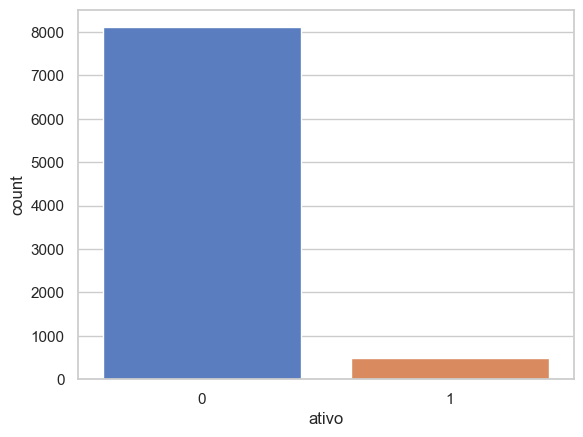

In [96]:
sns.countplot(x = df_cancelados.ativo)

In [97]:
dados_dummy = df_cancelados[['item', 'cupom', 'cidade', 'estado']]
dados_num = df_cancelados.drop(columns=['item', 'onde_conheceu','cupom', 'cidade', 
                                         'estado'])
dados_dummy = pd.get_dummies(dados_dummy)
df_cancelados_dummy = pd.concat([dados_num, dados_dummy], axis=1)
df_cancelados_dummy.head()

,user_id,id_pedido,valor,valor_frete,valor_total,quantidade,sessoes,duracao_media_sessao,taxa_rejeicao,check_outs,...,estado_PR,estado_RJ,estado_RN,estado_RO,estado_RR,estado_RS,estado_SC,estado_SE,estado_SP,estado_TO
0,8859.0,1,134.9,20.46,155.36,1.0,4.0,516.750000,0.250000,1.0,...,0,0,0,0,0,0,0,0,1,0
1,5417.0,2,148.9,31.90,180.80,1.0,95.0,199.547368,0.094737,1.0,...,0,0,0,0,0,0,0,0,0,0
2,5417.0,2,148.9,31.90,180.80,1.0,95.0,199.547368,0.094737,1.0,...,0,0,0,0,0,0,0,0,0,0
3,5417.0,2,148.9,31.90,180.80,1.0,95.0,199.547368,0.094737,1.0,...,0,0,0,0,0,0,0,0,0,0
4,5417.0,2,148.9,31.90,180.80,1.0,95.0,199.547368,0.094737,1.0,...,0,0,0,0,0,0,0,0,0,0


In [98]:
y = df_cancelados_dummy.ativo.copy()
X = df_cancelados_dummy.drop(['ativo'], axis = 1)

# balanceador = RandomUnderSampler(random_state=SEED)

# X_resampled, y_resampled = balanceador.fit_resample(X, y)

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=101)
scaler = MinMaxScaler()

# Função para rodar os modelos
def run_modelo(modelo, X, y, cv):
    X = scaler.fit_transform(X)
    cv_results = cross_validate(modelo, X, y, cv=cv, n_jobs=-1, scoring=['precision', 'recall', 'accuracy'])
    acuracia_media = round(cv_results['test_accuracy'].mean(), 3)
    precisao_media =  round(cv_results['test_precision'].mean(), 3)
    recall_medio = round(cv_results['test_recall'].mean(), 3)
    return [acuracia_media, precisao_media, recall_medio]

rfc = RandomForestClassifier(random_state=SEED, n_jobs=-1)
gbc = GradientBoostingClassifier(random_state=SEED)
lr = LogisticRegression(random_state=SEED)
gnb = GaussianNB()
knn = KNeighborsClassifier(n_jobs=-1)
svc = SVC(random_state=SEED)

modelos = [rfc, gbc, lr, gnb, knn, svc]
nome_modelos = ['RandomForest', 'XGBoost', 'LinearRegression', 'NaiveBayes', 'KNN', 'SVM']
resultados = []

for i, modelo in enumerate(modelos):
    resultados.append(run_modelo(modelo, X, y, skf))

resultados = pd.DataFrame(resultados, index=nome_modelos, columns=['Acurácia', 'Precisão', 'Recall'])
resultados.sort_values('Recall', ascending = False)

,Acurácia,Precisão,Recall
NaiveBayes,0.340,0.060,0.712
XGBoost,0.963,0.872,0.409
RandomForest,0.955,0.873,0.270
LinearRegression,0.951,0.709,0.244
KNN,0.944,0.534,0.158
SVM,0.944,0.700,0.026


O melhor modelo é o XGboost. Assim como na regressão linear, vamos dividir a base para instanciar o modelo XGboost

In [99]:
X_treino, X_teste, y_treino, y_teste = train_test_split(scaler.fit_transform(X), y, 
                                                        test_size=0.25, random_state=SEED, stratify = y)
#gbclass = GradientBoostingClassifier(random_state=SEED)
gbc = gbc.fit(X_treino, y_treino)
predito_gbc = gbc.predict(X_teste)

print(classification_report(y_teste, predito_gbc))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      2028
           1       0.89      0.41      0.56       124

    accuracy                           0.96      2152
   macro avg       0.93      0.70      0.77      2152
weighted avg       0.96      0.96      0.96      2152



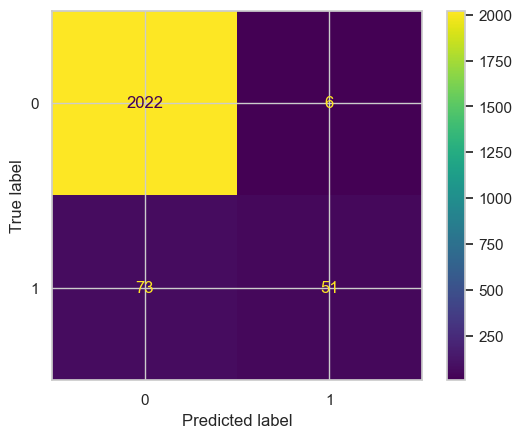

In [100]:
cm_gbc = confusion_matrix(y_teste, predito_gbc)
disp_gbc = ConfusionMatrixDisplay(confusion_matrix = cm_gbc)
disp_gbc.plot()

In [101]:
X1 = scaler.fit_transform(df_cancelados_dummy.drop(['ativo'], axis = 1))
propensao = gbc.predict_proba(X1)
df_cancelados['propensao_gbc'] = propensao[::, 1]
df_cancelados.sort_values('propensao_gbc', ascending = False)[['id_pedido', 'valor', 'valor_frete', 'propensao_gbc']]

,id_pedido,valor,valor_frete,propensao_gbc
8117,1871,199.9,34.90,0.990932
8265,130,143.9,29.90,0.990677
8387,248,143.9,40.90,0.990002
8396,255,150.9,18.90,0.990002
8108,1864,134.9,29.90,0.989073
...,...,...,...,...
5524,1133,134.9,29.90,0.001803
6440,1325,104.9,27.17,0.001785
7709,1651,49.8,0.00,0.001765
8082,1844,164.9,25.48,0.001728


Agora temos uma estimativa da probabilidade de cancelamento, podemos testar para os novos clientes ao longo do tempo

# Exemplificando uso em produção

Vamos usar os dados definidos anteriormente para simular o uso dos modelos em novos assinantes

## Etapa 2:

In [102]:
dados_comportamento = pd.DataFrame(columns=df_le_salvo.columns, data=dados_comportamento, index = df_le_salvo.index[:1])
dados_cupom = pd.DataFrame(columns=df_le_salvo.columns, data=dados_cupom, index = df_le_salvo.index[:1])
dados_item = pd.DataFrame(columns=df_le_salvo.columns, data=dados_item, index = df_le_salvo.index[:1])

dados_item

,user_id,valor,valor_frete,valor_total,item,quantidade,cupom,onde_conheceu,cidade,estado,...,comb_dimensoes_exclusivas,entradas,entradas_visualizacoes_pagina,pagina_por_sessoes,sessoes_por_usuario,saidas,rejeicoes,tempo_medio_pagina,visualizacoes_paginas_unicas,comprou
0,237,0,0,0,0,0,0,19,0,0,...,16,16,7,7,2,16,6,96,50,1


In [103]:
pred_comp = kmeans_pca.fit_predict(dados_comportamento.values.reshape(-1,1))
pred_cupom = kmeans_pca.fit_predict(dados_cupom.values.reshape(-1,1))
pred_item = kmeans_pca.fit_predict(dados_item.values.reshape(-1,1))

print(f'cluster: {pred_comp[0]}')
print(f'cluster: {pred_cupom[0]}')
print(f'cluster: {pred_item[0]}')

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\arsnf\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\ars

cluster: 3
cluster: 1
cluster: 2


Temos um cliente no cluster 3, com maior probabilidade de venda, que está pronto para o time de vendas entrar em contato com uma oferta. Enquanto os outros dois precisam ser mais nutritos via marketing para subir no jornada do cliente e atingir o patamar de ser chamado pelo time de vendas

# Etapa 4:

In [104]:
ex1 = {'recencia' : 7, 'frequencia' : 2}
ex2 = {'recencia' : 17, 'frequencia' : 1}
ex3 = {'recencia' : 2, 'frequencia' : 15}

ex1 = pd.DataFrame(ex1, index = df_ltv.index[:1])
ex2 = pd.DataFrame(ex2, index = df_ltv.index[:1])
ex3 = pd.DataFrame(ex3, index = df_ltv.index[:1])

reg_pred_ex1 = round(reg.predict(ex1)[0],2)
reg_pred_ex2 = round(reg.predict(ex2)[0],2)
reg_pred_ex3 = round(reg.predict(ex3)[0],2)

mes_ex1 = round(reg_pred_ex1/175.90)
mes_ex2 = round(reg_pred_ex2/175.90)
mes_ex3 = round(reg_pred_ex3/175.90)

print(f'LTV 1 = {reg_pred_ex1}, com {mes_ex1} meses de assinatura')
print(f'LTV 2 = {reg_pred_ex2}, com {mes_ex2} meses de assinatura')
print(f'LTV 3 = {reg_pred_ex3}, com {mes_ex3} meses de assinatura')

LTV 1 = 316.41, com 2 meses de assinatura
LTV 2 = 154.23, com 1 meses de assinatura
LTV 3 = 2424.34, com 14 meses de assinatura


Podemos ver que os primeiros exemplos devem ser impactados com campanhas de retenção para que não ocorra um cancelamento precoce das assinatura. Talvez informar sobre um programa de recompensas por tempo de assinatra.

Por outro lado o exemplo 3, ficará mais de 1 ano como assinante. Para ele, uma campanha de novos produtos e novidades na assinatura pode fazer com que fique por mais tempo ainda

# Etapa 5:

In [105]:
dados_cancelados = df_cancelados_dummy[df_cancelados_dummy.index == 5000].drop(['ativo'], axis = 1)
propensao = gbc.predict_proba(scaler.fit_transform(dados_cancelados))
print(f'A probabilidade do assinante cancelar é {round(propensao[::, 1][0]*100,2)}%')

A probabilidade do assinante cancelar é 6.26%


Neste exemplo temos um assinante com probabilidade de 6,26% de cancelamento. Podemos mandar mais conteúdos sobre como incluir itens na assinatura e novidades para que aumentemos o tiquete médio e torne uma experiência mais completa.

# Conclusão

Temos um algoritmo que pode prever a intenção de compra, recomendações de produtos para novos assinantes, previsão de quanto será faturado por cliente e quantos meses de assinatura teremos e por fim a probabilidade de cancelamento desse assinante.

Em produção esse algoritmo pode ser rodado e atualizado todo mês para prevermos as alterações de cada lead e cada assinante. Então podemos criar campanhas de marketing voltadas aos leads que estão mais propensos a comprar e campanhas de customer success para os assinantes que tem similaridades para recomendação de compras ou com alta probabilidade de cancelar. 